In [678]:
import pandas as pd
import numpy as np

In [60]:
# collect data
df_2024 = pd.read_json('data/data_eda_mml_2024jan_2024mar.json', lines = True)
df_2023 = pd.read_json('data/data_eda_mml_2023jan_2023dec.json', lines = True)
df_2022 = pd.read_json('data/data_eda_mml_2022jan_2022dec.json', lines = True)

df_all = pd.read_json('data/df_total_products.json', lines = True)
# df_price_gt = pd.read_excel('data/other data/price_gt.xlsx', sheet_name = 'price_gt')

df = pd.concat(
    [
        df_2022,
        df_2023,
        df_2024
    ],
    ignore_index = True
)

df_holiday = pd.read_csv('MASTER_CALENDAR_edit.csv')
df_holiday = df_holiday.rename(
    columns = {
        'DATE': 'CALDAY'
    }
)

# transform datatype
df['CALDAY'] = pd.to_datetime(df['CALDAY'])
df['PERIOD_TAG'] = pd.to_datetime(df['PERIOD_TAG'])
df_holiday['CALDAY'] = pd.to_datetime(df_holiday['CALDAY'])
df_all['CALDAY'] = pd.to_datetime(df_all['CALDAY'])

df_final = pd.merge(
    df,
    df_holiday,
    on = ['CALDAY']
)

df_final = df_final[[
    'CALDAY', 'DOW', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'REGION_DOMAIN',
   'IS_MBS', 'VALUE_TRANSACTIONS_NON_PROMOTION',
   'VALUE_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
   'VALUE_BASE_SALE_QTY_NON_PROMOTION', 'VALUE_BASE_SALE_QTY_PROMOTION',
   'VALUE_SALE_NON_PROMOTION', 'VALUE_SALE_PROMOTION',
   'VALUE_RETAIL_PRICE_NON_PROMOTION', 'VALUE_RETAIL_PRICE_PROMOTION',
   'PERIOD_TAG', 'PROMOTION_RATE',
   'LUNAR_DAY', 'LUNAR_MONTH', 'LUNAR_YEAR',
   'HOLIDAY', 'WORKING_HOLIDAYS', 'OFF_HOLIDAYS'
]]

df_final = pd.merge(
    df_final,
    df_all.rename(
        columns = {
            'VALUE_TOTAL_TRANSACTIONS': 'VALUE_TOTAL_TRANSACTIONS_CITY',
            'VALUE_TOTAL_SALE': 'VALUE_TOTAL_SALE_CITY'
        }
    ),
    how = 'left',
    on = ['CALDAY', 'DOW', 'CITY', 'REGION_DOMAIN', 'IS_MBS']
)

# agg base_sale_qty and sale
df_final['VALUE_BASE_SALE_QTY'] = df_final['VALUE_BASE_SALE_QTY_NON_PROMOTION'] + df_final['VALUE_BASE_SALE_QTY_PROMOTION']
df_final['VALUE_SALE'] = df_final['VALUE_SALE_NON_PROMOTION'] + df_final['VALUE_SALE_PROMOTION']

# by both promotion and non promotion
df_final['PROBA_PURCHASE_MML'] = df_final['VALUE_MML_TRANSACTIONS'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['TRANSACTION_SHARE_VALUE_MML'] = df_final['VALUE_SALE'] / df_final['VALUE_TOTAL_SALE_CITY']
df_final['AVG_TRANSACTION_VALUE_MML'] = df_final['VALUE_SALE'] / df_final['VALUE_MML_TRANSACTIONS']
df_final['AVG_VISIT_VALUE_MML'] = df_final['VALUE_SALE'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final['VALUE_BASE_SALE_QTY'] / df_final['VALUE_MML_TRANSACTIONS'] 
df_final['AVG_BASE_SALE_QTY_PER_VISIT_MML'] = df_final['VALUE_BASE_SALE_QTY'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']

# by promotion or non promotion
df_final['PROBA_PURCHASE_MML_PROMOTION'] = df_final['VALUE_TRANSACTIONS_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final['VALUE_SALE_PROMOTION'] / df_final['VALUE_TOTAL_SALE_CITY']
df_final['AVG_TRANSACTION_VALUE_MML_PROMOTION'] = df_final['VALUE_SALE_PROMOTION'] / df_final['VALUE_TRANSACTIONS_PROMOTION']
df_final['AVG_VISIT_VALUE_MML_PROMOTION'] = df_final['VALUE_SALE_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_PROMOTION'] / df_final['VALUE_TRANSACTIONS_PROMOTION'] 
df_final['AVG_BASE_SALE_QTY_PER_VISIT_MML_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']

df_final['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final['VALUE_TRANSACTIONS_NON_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final['VALUE_SALE_NON_PROMOTION'] / df_final['VALUE_TOTAL_SALE_CITY']
df_final['AVG_TRANSACTION_VALUE_MML_NON_PROMOTION'] = df_final['VALUE_SALE_NON_PROMOTION'] / df_final['VALUE_TRANSACTIONS_NON_PROMOTION']
df_final['AVG_VISIT_VALUE_MML_NON_PROMOTION'] = df_final['VALUE_SALE_NON_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_NON_PROMOTION'] / df_final['VALUE_TRANSACTIONS_NON_PROMOTION'] 
df_final['AVG_BASE_SALE_QTY_PER_VISIT_MML_NON_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_NON_PROMOTION'] / df_final['VALUE_TOTAL_TRANSACTIONS_CITY']

df_final['DOW'] = df_final['DOW'].astype('str')

# GT price
df_price_gt_melted = pd.melt(df_price_gt, id_vars=['Loại thịt', 'City', 'PRODUCT_ID',], value_vars=df_price_gt.columns[8:]) 
df_price_gt_melted = df_price_gt_melted[
    df_price_gt_melted['PRODUCT_ID'].notnull()
    & (df_price_gt_melted['PRODUCT_ID'] != 0)
].rename(
    columns = {
        'Loại thịt': 'PRODUCT_NAME_GT',
        'City': 'CITY',
        'variable': 'PERIOD_TAG',
        'value': 'RETAIL_PRICE_GT'
    }
)

df_price_gt_melted['PRODUCT_ID'] = df_price_gt_melted['PRODUCT_ID'].astype('int64')

df_price_gt_melted['CITY'] = np.where(
    df_price_gt_melted['CITY'] == 'Hồ Chí Minh', 'HỒ CHÍ MINH', 'HÀ NỘI'
)

df_price_gt_melted['PERIOD_TAG'] = pd.to_datetime(df_price_gt_melted['PERIOD_TAG'])


**NEW DATA**

In [679]:
df_holiday = pd.read_csv('MASTER_CALENDAR_edit.csv')
df_holiday = df_holiday.rename(
    columns = {
        'DATE': 'CALDAY'
    }
)

df_holiday['CALDAY'] = pd.to_datetime(df_holiday['CALDAY'])

In [680]:
df_total = pd.read_csv('data/data csv/df_total_product_2022jan_2024apr.csv')
df_total['CALDAY'] = pd.to_datetime(df_total['CALDAY']) 
df_total['PERIOD_TAG'] = df_total['CALDAY'].dt.to_period('W').apply(lambda r: r.start_time)
df_total['PERIOD_TAG'] = pd.to_datetime(df_total['PERIOD_TAG'])
df_total.head()

,CALDAY,IS_MBS,CITY,BUSINESS_UNIT,VALUE_TRANSACTIONS_TOTAL,VALUE_SALE_AMOUNT_TOTAL,PERIOD_TAG
0,2023-09-11,1,HỒ CHÍ MINH,1500,4836,1418660664,2023-09-11
1,2022-05-14,0,HÀ NỘI,1500,51836,16537725745,2022-05-09
2,2024-01-19,0,HÀ NỘI,2000,93171,10367900203,2024-01-15
3,2023-04-23,1,HÀ NỘI,2000,65204,9055603713,2023-04-17
4,2023-12-14,1,HÀ NỘI,2000,97045,10648044943,2023-12-11


In [681]:
df_mml_2022jan_2022dec = pd.read_csv('data/data csv/df_mml_2022jan_2022dec.csv')
df_mml_2023jan_2024mar = pd.read_csv('data/data csv/df_mml_2023jan_2024mar.csv')
df_mml_2024apr = pd.read_csv('data/data csv/df_mml_2024apr.csv')

df_mml = pd.concat([df_mml_2022jan_2022dec, df_mml_2023jan_2024mar, df_mml_2024apr], ignore_index = True)

df_mml['CALDAY'] = pd.to_datetime(df_mml['CALDAY']) 
df_mml.head()

,CALDAY,DOW,PRODUCT_ID,PRODUCT_NAME,CITY,REGION_DOMAIN,IS_MBS,BUSINESS_UNIT,VALUE_MML_TRANSACTIONS_NON_PROMOTION,VALUE_MML_TRANSACTIONS_PROMOTION,VALUE_MML_TRANSACTIONS,VALUE_BASE_SALE_QTY_MML_NON_PROMOTION,VALUE_BASE_SALE_QTY_MML_PROMOTION,VALUE_BASE_SALE_QTY_MML,VALUE_SALE_MML_NON_PROMOTION,VALUE_SALE_MML_PROMOTION,VALUE_SALE_MML,VALUE_RETAIL_PRICE_MML_NON_PROMOTION,VALUE_RETAIL_PRICE_MML_PROMOTION,VALUE_RETAIL_PRICE_MML
0,2022-01-07,6,10282283,MEAT DELI Cánh gà 400g,HÀ NỘI,North,0,2000,852,0,852,1045.0,0.0,1045.0,44830500.0,0.0,44830500.0,42900.0,0.0,42900.000000
1,2022-02-06,1,10282283,MEAT DELI Cánh gà 400g,HÀ NỘI,North,0,2000,594,0,594,750.0,0.0,750.0,32175000.0,0.0,32175000.0,42900.0,0.0,42900.000000
2,2022-02-04,6,10282268,MEAT DELI filê ức gà 500g,HÀ NỘI,North,0,2000,316,0,316,350.0,0.0,350.0,18165000.0,0.0,18165000.0,51900.0,0.0,51900.000000
3,2022-01-24,2,10282268,MEAT DELI filê ức gà 500g,HÀ NỘI,North,0,2000,730,17,747,817.0,15.0,832.0,42402300.0,703500.0,43105800.0,51900.0,46900.0,51809.855769
4,2022-02-04,6,10282268,MEAT DELI filê ức gà 500g,HÀ NỘI,North,0,1500,59,0,59,69.0,0.0,69.0,3581100.0,0.0,3581100.0,51900.0,0.0,51900.000000


In [682]:
df_mml.groupby(['PRODUCT_ID', 'PRODUCT_NAME'])['VALUE_SALE_MML'].sum().reset_index().sort_values(by = ['VALUE_SALE_MML'], ascending = False)[:10]

,PRODUCT_ID,PRODUCT_NAME,VALUE_SALE_MML
153,10617947,MEAT DELI Thịt heo xay chuẩn ngon (S),3.525499e+11
159,10617959,MEAT DELI Ba rọi heo (S),2.376931e+11
162,10617963,MEAT DELI [PRE] Thịt heo xay đặc biệt,1.650615e+11
87,10281593,MEAT DELI [PRE] Sườn thăn (sườn non) (S),1.586295e+11
157,10617957,MEAT DELI Nạc dăm heo (nạc vai) (S),1.104123e+11
85,10281591,MEAT DELI [PRE] Ba rọi đặc biệt (S),1.063889e+11
5,10140306,MEAT DELI Thịt xay tươi ướp sẵn,6.906735e+10
127,10283198,MEAT DELI Phi lê ức gà,6.680861e+10
86,10281592,MEAT DELI [PRE] Sườn St. Louis (S),6.345863e+10
88,10281594,MEAT DELI [PRE] Bắp giò cuộn (S),5.872889e+10


In [683]:
df_price_all_channel_hcm = pd.read_excel('data/data csv/price_all_channel_excel.xlsx', sheet_name = 'HCM')
df_price_all_channel_hn = pd.read_excel('data/data csv/price_all_channel_excel.xlsx', sheet_name = 'HN')

df_price_all_channel = pd.concat([df_price_all_channel_hcm, df_price_all_channel_hn], ignore_index = True)

df_price_all_channel['Date'] = pd.to_datetime(df_price_all_channel['Date']) 
df_price_all_channel['PERIOD_TAG'] = df_price_all_channel['Date'].dt.to_period('W').apply(lambda r: r.start_time)
df_price_all_channel['CITY'] = np.where(
    df_price_all_channel['City'] == 'TP. Hồ Chí Minh', 'HỒ CHÍ MINH', 'HÀ NỘI'
)

df_price_gt = df_price_all_channel[
    (df_price_all_channel['Channel'] == 'GT')
    & (~df_price_all_channel['WCM Ariticle'].isin(['Non-SKU', 'Non-Skus']) )
][[
    'Product Name', 'WCM Ariticle', 'WCM Product name ', 'CITY', 'PERIOD_TAG', 'Price'
]].rename(
    columns = {
        'Product Name': 'PRODUCT_NAME_GT',
        'WCM Ariticle': 'PRODUCT_ID',
        'WCM Product name ': 'PRODUCT_NAME',
        'Price': 'RETAIL_PRICE_GT'
    }
)

df_price_gt['PRODUCT_ID'] = df_price_gt['PRODUCT_ID'].astype('int64') 

df_price_gt = df_price_gt.groupby([
    'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'PERIOD_TAG'
])['RETAIL_PRICE_GT'].mean().reset_index()

df_price_gt.head()

,PRODUCT_ID,PRODUCT_NAME,CITY,PERIOD_TAG,RETAIL_PRICE_GT
0,10182358,MEAT DELI Dạ dày heo chuẩn ngon(S),HÀ NỘI,2021-12-27,198461.538462
1,10182358,MEAT DELI Dạ dày heo chuẩn ngon(S),HÀ NỘI,2022-02-07,200000.000000
2,10182358,MEAT DELI Dạ dày heo chuẩn ngon(S),HÀ NỘI,2022-02-14,198000.000000
3,10182358,MEAT DELI Dạ dày heo chuẩn ngon(S),HÀ NỘI,2022-02-21,191000.000000
4,10182358,MEAT DELI Dạ dày heo chuẩn ngon(S),HÀ NỘI,2022-02-28,191000.000000


In [684]:
# Check if there is any duplication
df_check_dup = df_price_gt.groupby(['PRODUCT_ID', 'CITY', 'PERIOD_TAG'])['RETAIL_PRICE_GT'].nunique().reset_index().sort_values(by = ['RETAIL_PRICE_GT'], ascending = False)
df_check_dup[
    df_check_dup['RETAIL_PRICE_GT'] > 1
]

,PRODUCT_ID,CITY,PERIOD_TAG,RETAIL_PRICE_GT


In [685]:
df_final = pd.merge(
    pd.merge(
        pd.merge(
            df_mml,
            df_total, 
            on = ['CALDAY', 'IS_MBS', 'CITY', 'BUSINESS_UNIT']
        ),
        df_price_gt[['PRODUCT_ID', 'CITY', 'PERIOD_TAG', 'RETAIL_PRICE_GT']],
        # how = 'left',
        on = ['CITY', 'PRODUCT_ID', 'PERIOD_TAG']
    ),
    df_holiday[['CALDAY', 'HOLIDAY', 'OFF_HOLIDAYS']],
    on = ['CALDAY']
)

df_final.head()

,CALDAY,DOW,PRODUCT_ID,PRODUCT_NAME,CITY,REGION_DOMAIN,IS_MBS,BUSINESS_UNIT,VALUE_MML_TRANSACTIONS_NON_PROMOTION,VALUE_MML_TRANSACTIONS_PROMOTION,...,VALUE_SALE_MML,VALUE_RETAIL_PRICE_MML_NON_PROMOTION,VALUE_RETAIL_PRICE_MML_PROMOTION,VALUE_RETAIL_PRICE_MML,VALUE_TRANSACTIONS_TOTAL,VALUE_SALE_AMOUNT_TOTAL,PERIOD_TAG,RETAIL_PRICE_GT,HOLIDAY,OFF_HOLIDAYS
0,2022-02-18,6,10618636,MEAT DELI Mỡ heo (S),HÀ NỘI,North,0,1500,9,0,...,299907.0,70900.000000,0.0,70900.000000,32633,10622549833,2022-02-14,52060.344828,NaN,0
1,2022-07-14,5,10618636,MEAT DELI Mỡ heo (S),HÀ NỘI,North,0,1500,34,0,...,1364638.0,73900.032492,0.0,73900.032492,43661,10599209357,2022-07-11,64189.475999,NaN,0
2,2022-03-24,5,10618636,MEAT DELI Mỡ heo (S),HÀ NỘI,North,0,2000,4,0,...,130456.0,70900.000000,0.0,70900.000000,184107,21754640145,2022-03-21,52666.666667,NaN,0
3,2022-05-19,5,10618636,MEAT DELI Mỡ heo (S),HÀ NỘI,North,0,2000,28,0,...,757408.0,61899.967310,0.0,61899.967310,194409,21345681213,2022-05-16,52605.000000,NaN,0
4,2022-06-26,1,10618636,MEAT DELI Mỡ heo (S),HÀ NỘI,North,0,2000,18,0,...,554005.0,61900.000000,0.0,61900.000000,211866,23363606115,2022-06-20,56615.000000,NaN,0


In [686]:
# both promotion and non promotion
df_final['PROBA_PURCHASE_MML'] = df_final['VALUE_MML_TRANSACTIONS'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['TRANSACTION_SHARE_VALUE_MML'] = df_final['VALUE_SALE_MML'] / df_final['VALUE_SALE_AMOUNT_TOTAL']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final['VALUE_BASE_SALE_QTY_MML'] / df_final['VALUE_MML_TRANSACTIONS'] 
df_final['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML'] = df_final['VALUE_BASE_SALE_QTY_MML'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['DIFF_PRICE_GT'] = df_final['VALUE_RETAIL_PRICE_MML'] - df_final['RETAIL_PRICE_GT']

# promotion 
df_final['PROBA_PURCHASE_MML_PROMOTION'] = df_final['VALUE_MML_TRANSACTIONS_PROMOTION'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final['VALUE_SALE_MML_PROMOTION'] / df_final['VALUE_SALE_AMOUNT_TOTAL']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final['VALUE_MML_TRANSACTIONS_PROMOTION'] 
df_final['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['DIFF_PRICE_GT_PROMOTION'] = df_final['VALUE_RETAIL_PRICE_MML_PROMOTION'] - df_final['RETAIL_PRICE_GT']

# non promotion
df_final['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final['VALUE_SALE_MML_NON_PROMOTION'] / df_final['VALUE_SALE_AMOUNT_TOTAL']
df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] 
df_final['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_NON_PROMOTION'] = df_final['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final['VALUE_TRANSACTIONS_TOTAL']
df_final['DIFF_PRICE_GT_NON_PROMOTION'] = df_final['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] - df_final['RETAIL_PRICE_GT']


In [216]:
df_final.to_csv('df_final_store_format.csv', index = False)

In [677]:
df_final2 = pd.merge(
    df_mml,
    df_total, 
    on = ['CALDAY', 'IS_MBS', 'CITY', 'BUSINESS_UNIT']
).groupby([
    'CALDAY', 'DOW', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'REGION_DOMAIN', 'BUSINESS_UNIT', 'PERIOD_TAG'
])[[
    'VALUE_MML_TRANSACTIONS_NON_PROMOTION',
    'VALUE_MML_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
    'VALUE_BASE_SALE_QTY_MML_NON_PROMOTION',
    'VALUE_BASE_SALE_QTY_MML_PROMOTION', 'VALUE_BASE_SALE_QTY_MML',
    'VALUE_SALE_MML_NON_PROMOTION', 'VALUE_SALE_MML_PROMOTION',
    'VALUE_SALE_MML', 'VALUE_TRANSACTIONS_TOTAL', 'VALUE_SALE_AMOUNT_TOTAL'
]].sum().reset_index()

df_final2['VALUE_RETAIL_PRICE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_BASE_SALE_QTY_MML']
df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION']
df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION']

df_final2 = pd.merge(
    pd.merge(
        df_final2,
        df_price_gt[['PRODUCT_ID', 'CITY', 'PERIOD_TAG', 'RETAIL_PRICE_GT']],
        # how = 'left',
        on = ['CITY', 'PRODUCT_ID', 'PERIOD_TAG']
    ),
    df_holiday[['CALDAY', 'HOLIDAY', 'OFF_HOLIDAYS']],
    on = ['CALDAY']
)

# both promotion and non promotion
df_final2['PROBA_PURCHASE_MML'] = df_final2['VALUE_MML_TRANSACTIONS'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_MML_TRANSACTIONS'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT'] = df_final2['VALUE_RETAIL_PRICE_MML'] - df_final2['RETAIL_PRICE_GT']

# promotion 
df_final2['PROBA_PURCHASE_MML_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

# non promotion
df_final2['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_NON_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

In [228]:
df_final2.to_csv('df_final_store_format_2.csv', index = False)

In [276]:
df_final2.groupby(['PRODUCT_NAME'])['VALUE_SALE_MML'].sum().reset_index().sort_values(by = ['VALUE_SALE_MML'], ascending = False)[:10]['PRODUCT_NAME'].to_list()

['MEAT DELI Thịt heo xay chuẩn ngon (S)',
 'MEAT DELI Ba rọi heo (S)',
 'MEAT DELI [PRE] Sườn thăn (sườn non) (S)',
 'MEAT DELI Nạc dăm heo (nạc vai) (S)',
 'MEAT DELI [PRE] Bắp giò cuộn (S)',
 'MEAT DELI Thịt vai heo (S)',
 'MEAT DELI Sườn vai heo (S)',
 'MEAT DELI Chân giò heo rút xương (S)',
 'MEAT DELI Thịt đùi heo (S)',
 'MEAT DELI Cốt lết heo (S)']

In [260]:
import statsmodels.api as sm
from pygam import GAM, ExpectileGAM, s, l, f
from sklearn.preprocessing import LabelEncoder

**PRICE OPTIMIZATION BY PRODUCT/CITY**

In [687]:
top4_SKU = [
    'MEAT DELI Thịt heo xay chuẩn ngon (S)',
    'MEAT DELI Ba rọi heo (S)',
    'MEAT DELI [PRE] Sườn thăn (sườn non) (S)',
    'MEAT DELI Nạc dăm heo (nạc vai) (S)'
]

# case 1: set static price regardless of BUSINESS_UNIT & DOW
df_final2 = pd.merge(
    df_mml,
    df_total, 
    on = ['CALDAY', 'IS_MBS', 'CITY', 'BUSINESS_UNIT']
).groupby([
    'PERIOD_TAG', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY'
])[[
    'VALUE_MML_TRANSACTIONS_NON_PROMOTION',
    'VALUE_MML_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
    'VALUE_BASE_SALE_QTY_MML_NON_PROMOTION',
    'VALUE_BASE_SALE_QTY_MML_PROMOTION', 'VALUE_BASE_SALE_QTY_MML',
    'VALUE_SALE_MML_NON_PROMOTION', 'VALUE_SALE_MML_PROMOTION',
    'VALUE_SALE_MML', 'VALUE_TRANSACTIONS_TOTAL', 'VALUE_SALE_AMOUNT_TOTAL'
]].sum().reset_index()

df_final2['VALUE_RETAIL_PRICE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_BASE_SALE_QTY_MML']
df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION']
df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION']

df_final2 = pd.merge(
        df_final2,
        df_price_gt[['PRODUCT_ID', 'CITY', 'PERIOD_TAG', 'RETAIL_PRICE_GT']],
        # how = 'left',
        on = ['CITY', 'PRODUCT_ID', 'PERIOD_TAG']
    )

# both promotion and non promotion
df_final2['PROBA_PURCHASE_MML'] = df_final2['VALUE_MML_TRANSACTIONS'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_MML_TRANSACTIONS'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT'] = df_final2['VALUE_RETAIL_PRICE_MML'] - df_final2['RETAIL_PRICE_GT']

# promotion 
df_final2['PROBA_PURCHASE_MML_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

# non promotion
df_final2['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_NON_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

In [688]:
data_filtered = df_final2[
    (~ df_final2['DIFF_PRICE_GT'].isnull())
    & df_final2['PRODUCT_NAME'].isin(top4_SKU)
    # & df_final2['DOW'].isin([1])
    # & df_final2['CITY'].isin(['HỒ CHÍ MINH'])
    # & df_final2['BUSINESS_UNIT'].isin([1500])
][[
    'PERIOD_TAG', 'PRODUCT_NAME', 'CITY', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'PROBA_PURCHASE_MML', 'AVG_BASE_SALE_QTY_PER_TRANSACTION_MML', 'VALUE_BASE_SALE_QTY_MML', 'DIFF_PRICE_GT', 'VALUE_TRANSACTIONS_TOTAL'
]]

# Create an empty dataframe to store the concatenated results
all_gam_results = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        # for business_unit in data_filtered['BUSINESS_UNIT'].unique():
        #     for dow in data_filtered['DOW'].unique():
        product_data = data_filtered[
            (data_filtered['PRODUCT_NAME'] == product)
            & (data_filtered['CITY'] == city)
            # & (data_filtered['BUSINESS_UNIT'] == business_unit)
            # & (data_filtered['DOW'] == dow)
        ]

        X = product_data['DIFF_PRICE_GT']
        y = product_data['VALUE_BASE_SALE_QTY_MML']

        quantiles = [0.025, 0.5, 0.975]
        gam_results = {}

        # Fit the GAM model for the filtered data
        for q in quantiles: 
            try: 
                gam = ExpectileGAM(s(0), expectile = q)
                gam.fit(X, y)
                gam_results[f"pred_BASE_SALE_QTY_MML_{q}"] = gam.predict(X)
            except:
                continue

        # Store the results in a dataframe with index that matches the original data
        predictions_gam = pd.DataFrame(gam_results).set_index(X.index)

        # Concatenate the results column-wise with the original data
        predictions_gam_df = pd.concat([
            product_data[['PERIOD_TAG', 'PRODUCT_NAME', 'CITY', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'DIFF_PRICE_GT', 'VALUE_BASE_SALE_QTY_MML', 'PROBA_PURCHASE_MML', 'VALUE_TRANSACTIONS_TOTAL']],
            predictions_gam
        ], 
            axis = 1
        )

        # Concatenate results row-wise
        all_gam_results = pd.concat([
            all_gam_results, predictions_gam_df
        ],
            axis = 0
        )


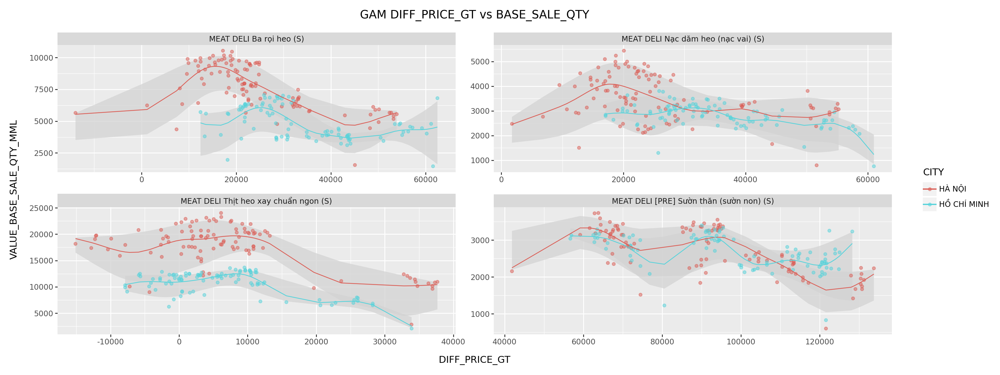

In [689]:
# VISUALIZE
# from plotnine import ggplot, aes, geom_point, geom_ribbon, geom_line, facet_wrap, labs, theme
from plotnine import *

fig = ggplot(
        data = all_gam_results,
        mapping = aes(x='DIFF_PRICE_GT', y='VALUE_BASE_SALE_QTY_MML', color='CITY', group='CITY')
    ) + geom_ribbon(
            aes(ymax='pred_BASE_SALE_QTY_MML_0.975', ymin='pred_BASE_SALE_QTY_MML_0.025'), 
            fill='#d3d3d3', 
            color='#FF000000', 
            alpha=0.75, 
            show_legend = False
    ) + geom_point(
            alpha=0.5
    ) + geom_line(
        aes(y = 'pred_BASE_SALE_QTY_MML_0.5', color = 'CITY'),
        # color = 'blue'
    ) + facet_wrap(
        'PRODUCT_NAME',
        ncol=2,
        scales='free'
    ) + labs(
        title = 'GAM DIFF_PRICE_GT vs BASE_SALE_QTY'
    ) + theme(
        figure_size=(16, 6) # here define the plot size
    )

fig.show()


In [692]:
# Optimize Price for Predicted Daily Revenue
for col in all_gam_results.columns:
    if col.startswith('pred'):
        all_gam_results['REV_' + col] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results[col] 

all_gam_results['REV_actual'] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results['VALUE_BASE_SALE_QTY_MML'] 

best_50 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.5'] == x['REV_pred_BASE_SALE_QTY_MML_0.5'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_975 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.975'] == x['REV_pred_BASE_SALE_QTY_MML_0.975'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_025 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.025'] == x['REV_pred_BASE_SALE_QTY_MML_0.025'].max()
    ].head(1)
).reset_index(level=0, drop=True)


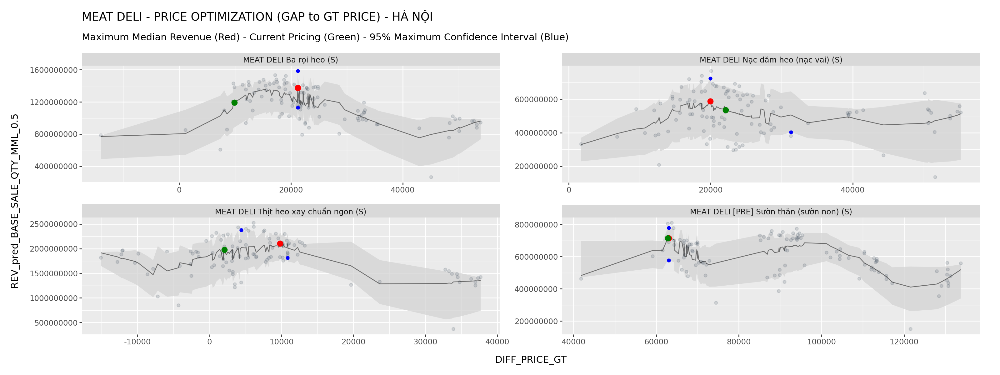

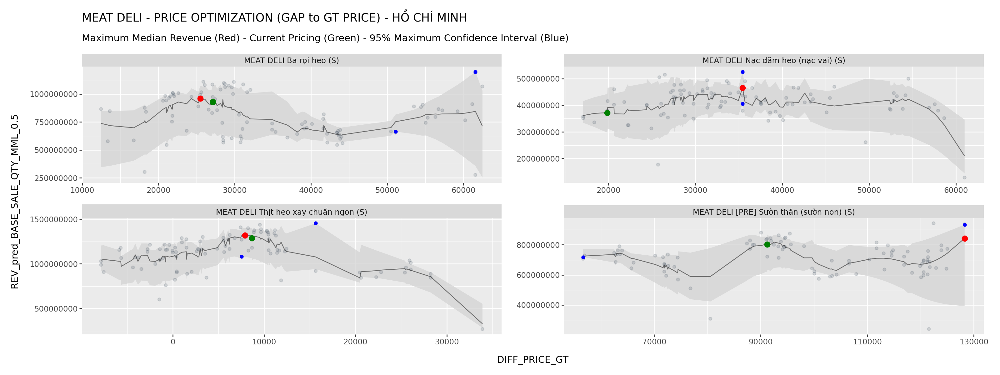

In [693]:
latest_values = all_gam_results.groupby(['CITY', 'PRODUCT_NAME']).agg({'PERIOD_TAG': 'max'})
latest_data = all_gam_results.merge(latest_values, on=['CITY', 'PRODUCT_NAME', 'PERIOD_TAG'], how='inner')

for city in all_gam_results['CITY'].unique():
    fig = ggplot(
            data = all_gam_results[
                (all_gam_results['CITY'] == city)
                & (all_gam_results['PRODUCT_NAME'].isin(top4_SKU))
            ],
            mapping = aes(x='DIFF_PRICE_GT', y='REV_pred_BASE_SALE_QTY_MML_0.5')
        ) + geom_ribbon(
                aes(ymax='REV_pred_BASE_SALE_QTY_MML_0.975', ymin='REV_pred_BASE_SALE_QTY_MML_0.025'), 
                fill='#d3d3d3', 
                color='#FF000000', 
                alpha=0.75, 
                show_legend = False
        ) + geom_point(
                aes(y='REV_actual'), alpha=0.15, color = '#2C3E50'
        ) + geom_line(
                aes(y = 'REV_pred_BASE_SALE_QTY_MML_0.5'),
                alpha=0.5
        ) + geom_point(
                data = best_50[
                    (best_50['CITY'] == city)
                    & (best_50['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                color = 'red',
                size = 3
        ) + geom_point(
                data = best_975[
                    (best_975['CITY'] == city)
                    & (best_975['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.975'),
                color = 'blue'
        ) + geom_point(
                data = best_025[
                    (best_025['CITY'] == city)
                    & (best_025['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.025'),
                color = 'blue'
        ) + geom_point(
                data = latest_data[
                    (latest_data['CITY'] == city)
                    & (latest_data['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(x= 'DIFF_PRICE_GT'),
                color = 'green',
                size = 3
        ) + facet_wrap(
            'PRODUCT_NAME',
            ncol=2,
            scales='free'
        ) + labs(
            title = f'MEAT DELI - PRICE OPTIMIZATION (GAP to GT PRICE) - {city}',
            subtitle = 'Maximum Median Revenue (Red) - Current Pricing (Green) - 95% Maximum Confidence Interval (Blue)'
        ) + theme(
            figure_size=(16, 6) # here define the plot size
        )

    fig.show()

In [695]:
all_gam_results.columns

Index(['PERIOD_TAG', 'PRODUCT_NAME', 'CITY', 'VALUE_RETAIL_PRICE_MML',
       'RETAIL_PRICE_GT', 'DIFF_PRICE_GT', 'VALUE_BASE_SALE_QTY_MML',
       'PROBA_PURCHASE_MML', 'VALUE_TRANSACTIONS_TOTAL',
       'pred_BASE_SALE_QTY_MML_0.025', 'pred_BASE_SALE_QTY_MML_0.5',
       'pred_BASE_SALE_QTY_MML_0.975', 'REV_pred_BASE_SALE_QTY_MML_0.025',
       'REV_pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.975',
       'REV_actual'],
      dtype='object')

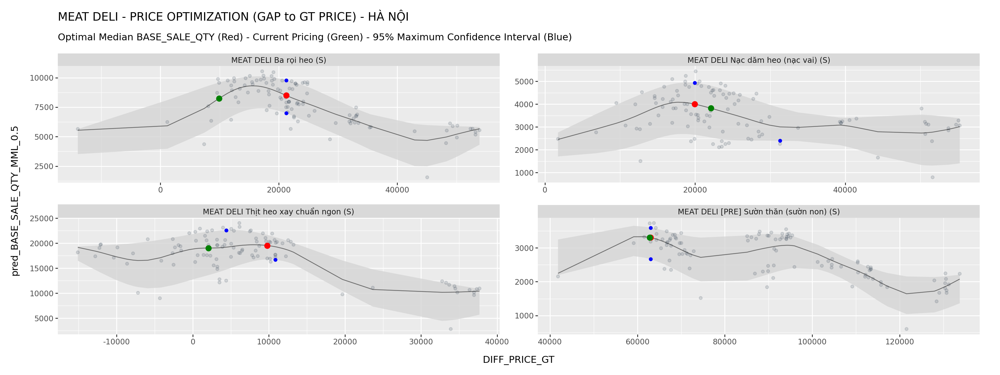

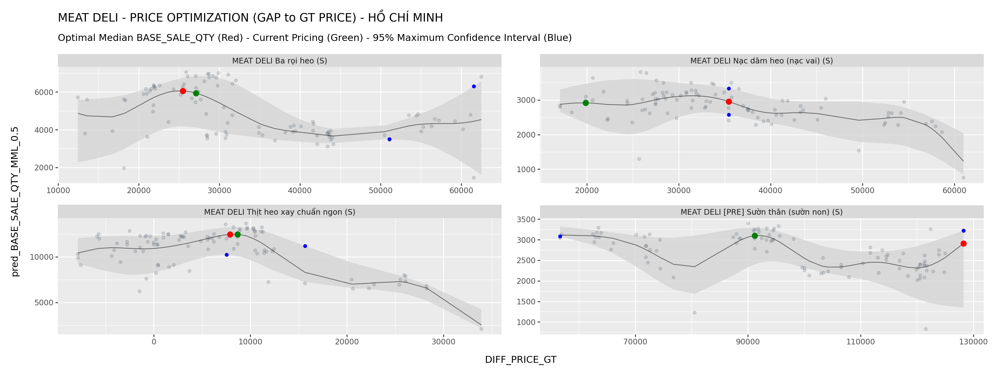

In [698]:
latest_values = all_gam_results.groupby(['CITY', 'PRODUCT_NAME']).agg({'PERIOD_TAG': 'max'})
latest_data = all_gam_results.merge(latest_values, on=['CITY', 'PRODUCT_NAME', 'PERIOD_TAG'], how='inner')

for city in all_gam_results['CITY'].unique():
    fig = ggplot(
            data = all_gam_results[
                (all_gam_results['CITY'] == city)
                & (all_gam_results['PRODUCT_NAME'].isin(top4_SKU))
            ],
            mapping = aes(x='DIFF_PRICE_GT', y='pred_BASE_SALE_QTY_MML_0.5')
        ) + geom_ribbon(
                aes(ymax='pred_BASE_SALE_QTY_MML_0.975', ymin='pred_BASE_SALE_QTY_MML_0.025'), 
                fill='#d3d3d3', 
                color='#FF000000', 
                alpha=0.75, 
                show_legend = False
        ) + geom_point(
                aes(y='VALUE_BASE_SALE_QTY_MML'), alpha=0.15, color = '#2C3E50'
        ) + geom_line(
                aes(y = 'pred_BASE_SALE_QTY_MML_0.5'),
                alpha=0.5
        ) + geom_point(
                data = best_50[
                    (best_50['CITY'] == city)
                    & (best_50['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                color = 'red',
                size = 3
        ) + geom_point(
                data = best_975[
                    (best_975['CITY'] == city)
                    & (best_975['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'pred_BASE_SALE_QTY_MML_0.975'),
                color = 'blue'
        ) + geom_point(
                data = best_025[
                    (best_025['CITY'] == city)
                    & (best_025['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'pred_BASE_SALE_QTY_MML_0.025'),
                color = 'blue'
        ) + geom_point(
                data = latest_data[
                    (latest_data['CITY'] == city)
                    & (latest_data['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(x= 'DIFF_PRICE_GT'),
                color = 'green',
                size = 3
        ) + facet_wrap(
            'PRODUCT_NAME',
            ncol=2,
            scales='free'
        ) + labs(
            title = f'MEAT DELI - PRICE OPTIMIZATION (GAP to GT PRICE) - {city}',
            subtitle = 'Optimal Median BASE_SALE_QTY (Red) - Current Pricing (Green) - 95% Maximum Confidence Interval (Blue)'
        ) + theme(
            figure_size=(16, 6) # here define the plot size
        )

    fig.show()

In [610]:
df_result = pd.merge(
    best_50[[
        'CITY', 'PRODUCT_NAME', 'DIFF_PRICE_GT', 'REV_actual', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].reset_index(drop = True).rename(
        columns = {
            'DIFF_PRICE_GT': 'OPTIMAL_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_REV',
        }
    ),
    latest_data[[
        'CITY', 'PRODUCT_NAME', 'DIFF_PRICE_GT', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].rename(
        columns = {
            'DIFF_PRICE_GT': 'CURRENT_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_REV',       
        }
    ),
    on = ['CITY', 'PRODUCT_NAME']
)

df_result['REV_increase_%'] = ( df_result['OPTIMAL_FORECAST_REV'] - df_result['CURRENT_FORECAST_REV'] ) / df_result['CURRENT_FORECAST_REV']
df_result.to_csv('output/results/PRICE OPTIMIZATION by CITY-PRODUCT.csv', index = False)

**PRICE OPTIMIZATION BY PRODUCT/CITY/BUSINESS UNIT**

In [699]:
top4_SKU = [
    'MEAT DELI Thịt heo xay chuẩn ngon (S)',
    'MEAT DELI Ba rọi heo (S)',
    'MEAT DELI [PRE] Sườn thăn (sườn non) (S)',
    'MEAT DELI Nạc dăm heo (nạc vai) (S)'
]

# case 1: set static price regardless of BUSINESS_UNIT & DOW
df_final2 = pd.merge(
    df_mml,
    df_total, 
    on = ['CALDAY', 'IS_MBS', 'CITY', 'BUSINESS_UNIT']
).groupby([
    'PERIOD_TAG', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT'
])[[
    'VALUE_MML_TRANSACTIONS_NON_PROMOTION',
    'VALUE_MML_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
    'VALUE_BASE_SALE_QTY_MML_NON_PROMOTION',
    'VALUE_BASE_SALE_QTY_MML_PROMOTION', 'VALUE_BASE_SALE_QTY_MML',
    'VALUE_SALE_MML_NON_PROMOTION', 'VALUE_SALE_MML_PROMOTION',
    'VALUE_SALE_MML', 'VALUE_TRANSACTIONS_TOTAL', 'VALUE_SALE_AMOUNT_TOTAL'
]].sum().reset_index()

df_final2['VALUE_RETAIL_PRICE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_BASE_SALE_QTY_MML']
df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION']
df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION']

df_final2 = pd.merge(
        df_final2,
        df_price_gt[['PRODUCT_ID', 'CITY', 'PERIOD_TAG', 'RETAIL_PRICE_GT']],
        # how = 'left',
        on = ['CITY', 'PRODUCT_ID', 'PERIOD_TAG']
    )

# both promotion and non promotion
df_final2['PROBA_PURCHASE_MML'] = df_final2['VALUE_MML_TRANSACTIONS'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_MML_TRANSACTIONS'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT'] = df_final2['VALUE_RETAIL_PRICE_MML'] - df_final2['RETAIL_PRICE_GT']

# promotion 
df_final2['PROBA_PURCHASE_MML_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

# non promotion
df_final2['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_NON_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

In [700]:
data_filtered = df_final2[
    (~ df_final2['DIFF_PRICE_GT'].isnull())
    & df_final2['PRODUCT_NAME'].isin(top4_SKU)
    # & df_final2['DOW'].isin([1])
    # & df_final2['CITY'].isin(['HỒ CHÍ MINH'])
    # & df_final2['BUSINESS_UNIT'].isin([1500])
][[
    'PERIOD_TAG', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'PROBA_PURCHASE_MML', 'AVG_BASE_SALE_QTY_PER_TRANSACTION_MML', 'VALUE_BASE_SALE_QTY_MML', 'DIFF_PRICE_GT', 'VALUE_TRANSACTIONS_TOTAL'
]]

# Create an empty dataframe to store the concatenated results
all_gam_results = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        for business_unit in data_filtered['BUSINESS_UNIT'].unique():
            #     for dow in data_filtered['DOW'].unique():
            product_data = data_filtered[
                (data_filtered['PRODUCT_NAME'] == product)
                & (data_filtered['CITY'] == city)
                & (data_filtered['BUSINESS_UNIT'] == business_unit)
                # & (data_filtered['DOW'] == dow)
            ]

            X = product_data['DIFF_PRICE_GT']
            y = product_data['VALUE_BASE_SALE_QTY_MML']

            quantiles = [0.025, 0.5, 0.975]
            gam_results = {}

            # Fit the GAM model for the filtered data
            for q in quantiles: 
                try: 
                    gam = ExpectileGAM(s(0), expectile = q)
                    gam.fit(X, y)
                    gam_results[f"pred_BASE_SALE_QTY_MML_{q}"] = gam.predict(X)
                except:
                    continue

            # Store the results in a dataframe with index that matches the original data
            predictions_gam = pd.DataFrame(gam_results).set_index(X.index)

            # Concatenate the results column-wise with the original data
            predictions_gam_df = pd.concat([
                product_data[['PERIOD_TAG', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'DIFF_PRICE_GT', 'VALUE_BASE_SALE_QTY_MML', 'PROBA_PURCHASE_MML', 'VALUE_TRANSACTIONS_TOTAL']],
                predictions_gam
            ], 
                axis = 1
            )

            # Concatenate results row-wise
            all_gam_results = pd.concat([
                all_gam_results, predictions_gam_df
            ],
                axis = 0
            )


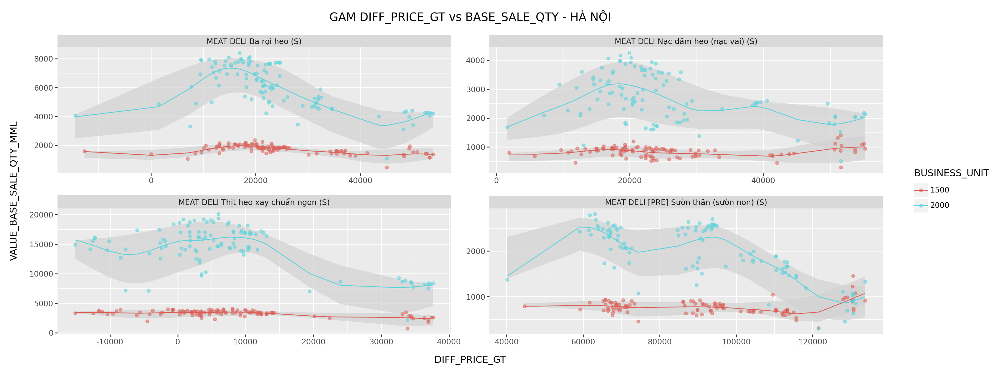

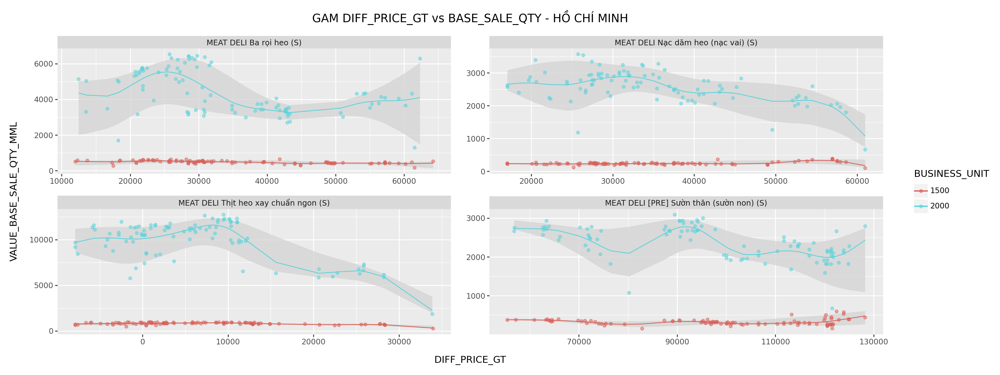

In [701]:
# VISUALIZE
# from plotnine import ggplot, aes, geom_point, geom_ribbon, geom_line, facet_wrap, labs, theme
from plotnine import *

all_gam_results['BUSINESS_UNIT'] = all_gam_results['BUSINESS_UNIT'].astype('str')

for city in all_gam_results['CITY'].unique():
    fig = ggplot(
            data = all_gam_results[
                all_gam_results['CITY'] == city
            ],
            mapping = aes(x='DIFF_PRICE_GT', y='VALUE_BASE_SALE_QTY_MML', color='BUSINESS_UNIT', group='BUSINESS_UNIT')
        ) + geom_ribbon(
                aes(ymax='pred_BASE_SALE_QTY_MML_0.975', ymin='pred_BASE_SALE_QTY_MML_0.025'), 
                fill='#d3d3d3', 
                color='#FF000000', 
                alpha=0.75, 
                show_legend = False
        ) + geom_point(
                alpha=0.5
        ) + geom_line(
            aes(y = 'pred_BASE_SALE_QTY_MML_0.5', color = 'BUSINESS_UNIT'),
            # color = 'blue'
        ) + facet_wrap(
            'PRODUCT_NAME',
            ncol=2,
            scales='free'
        ) + labs(
            title = f'GAM DIFF_PRICE_GT vs BASE_SALE_QTY - {city}'
        ) + theme(
            figure_size=(16, 6) # here define the plot size
        )

    fig.show()

In [702]:
# Optimize Price for Predicted Daily Revenue
for col in all_gam_results.columns:
    if col.startswith('pred'):
        all_gam_results['REV_' + col] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results[col] 

all_gam_results['REV_actual'] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results['VALUE_BASE_SALE_QTY_MML'] 

best_50 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.5'] == x['REV_pred_BASE_SALE_QTY_MML_0.5'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_975 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.975'] == x['REV_pred_BASE_SALE_QTY_MML_0.975'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_025 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.025'] == x['REV_pred_BASE_SALE_QTY_MML_0.025'].max()
    ].head(1)
).reset_index(level=0, drop=True)

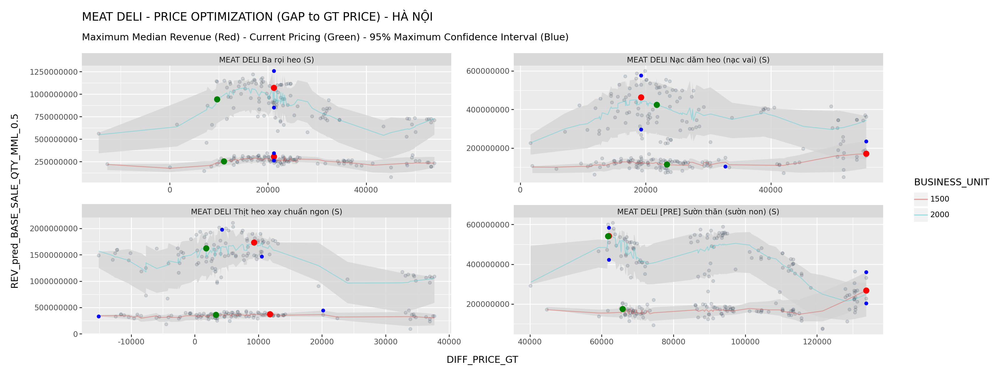

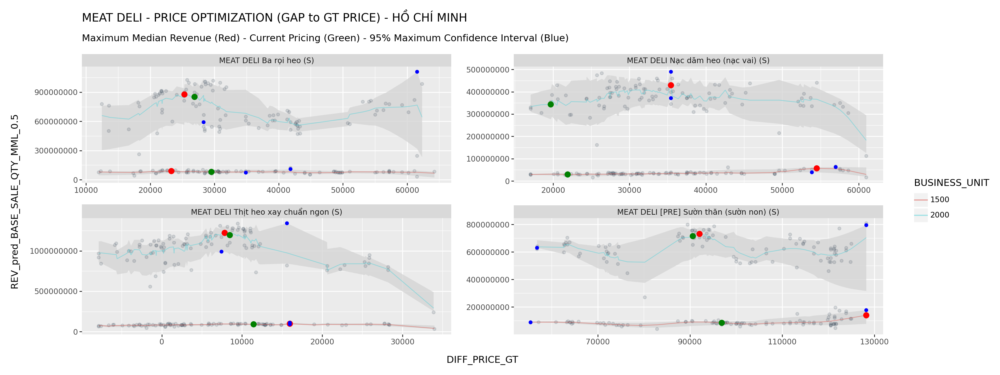

In [703]:
latest_values = all_gam_results.groupby(['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT']).agg({'PERIOD_TAG': 'max'})
latest_data = all_gam_results.merge(latest_values, on=['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'PERIOD_TAG'], how='inner')

for city in all_gam_results['CITY'].unique():
    fig = ggplot(
            data = all_gam_results[
                (all_gam_results['CITY'] == city)
                & (all_gam_results['PRODUCT_NAME'].isin(top4_SKU))
            ],
            mapping = aes(x='DIFF_PRICE_GT', y='REV_pred_BASE_SALE_QTY_MML_0.5', color = 'BUSINESS_UNIT', group = 'BUSINESS_UNIT')
        ) + geom_ribbon(
                aes(ymax='REV_pred_BASE_SALE_QTY_MML_0.975', ymin='REV_pred_BASE_SALE_QTY_MML_0.025'), 
                fill='#d3d3d3', 
                color='#FF000000', 
                alpha=0.75, 
                show_legend = False
        ) + geom_point(
                aes(y='REV_actual'), alpha=0.15, color = '#2C3E50'
        ) + geom_line(
                aes(y = 'REV_pred_BASE_SALE_QTY_MML_0.5'),
                alpha=0.5
        ) + geom_point(
                data = best_50[
                    (best_50['CITY'] == city)
                    & (best_50['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                color = 'red',
                size = 3
        ) + geom_point(
                data = best_975[
                    (best_975['CITY'] == city)
                    & (best_975['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.975'),
                color = 'blue'
        ) + geom_point(
                data = best_025[
                    (best_025['CITY'] == city)
                    & (best_025['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.025'),
                color = 'blue'
        ) + geom_point(
                data = latest_data[
                    (latest_data['CITY'] == city)
                    & (latest_data['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(x= 'DIFF_PRICE_GT'),
                color = 'green',
                size = 3
        ) + facet_wrap(
            'PRODUCT_NAME',
            ncol=2,
            scales='free'
        ) + labs(
            title = f'MEAT DELI - PRICE OPTIMIZATION (GAP to GT PRICE) - {city}',
            subtitle = 'Maximum Median Revenue (Red) - Current Pricing (Green) - 95% Maximum Confidence Interval (Blue)'
        ) + theme(
            figure_size=(16, 6) # here define the plot size
        )

    fig.show()

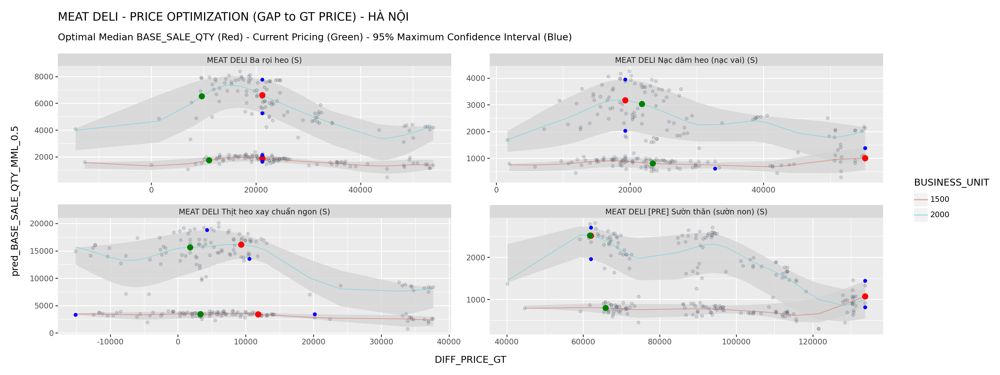

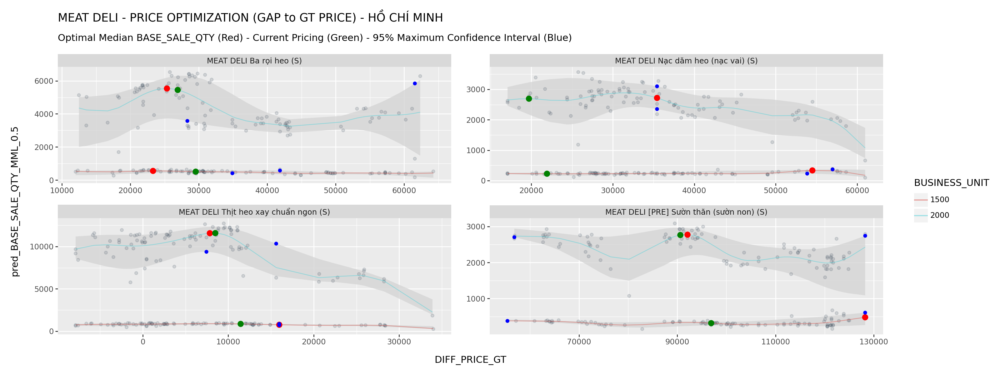

In [707]:
latest_values = all_gam_results.groupby(['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT']).agg({'PERIOD_TAG': 'max'})
latest_data = all_gam_results.merge(latest_values, on=['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'PERIOD_TAG'], how='inner')

for city in all_gam_results['CITY'].unique():
    fig = ggplot(
            data = all_gam_results[
                (all_gam_results['CITY'] == city)
                & (all_gam_results['PRODUCT_NAME'].isin(top4_SKU))
            ],
            mapping = aes(x='DIFF_PRICE_GT', y='pred_BASE_SALE_QTY_MML_0.5', color = 'BUSINESS_UNIT', group = 'BUSINESS_UNIT')
        ) + geom_ribbon(
                aes(ymax='pred_BASE_SALE_QTY_MML_0.975', ymin='pred_BASE_SALE_QTY_MML_0.025'), 
                fill='#d3d3d3', 
                color='#FF000000', 
                alpha=0.75, 
                show_legend = False
        ) + geom_point(
                aes(y='VALUE_BASE_SALE_QTY_MML'), alpha=0.15, color = '#2C3E50'
        ) + geom_line(
                aes(y = 'pred_BASE_SALE_QTY_MML_0.5'),
                alpha=0.5
        ) + geom_point(
                data = best_50[
                    (best_50['CITY'] == city)
                    & (best_50['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                color = 'red',
                size = 3
        ) + geom_point(
                data = best_975[
                    (best_975['CITY'] == city)
                    & (best_975['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'pred_BASE_SALE_QTY_MML_0.975'),
                color = 'blue'
        ) + geom_point(
                data = best_025[
                    (best_025['CITY'] == city)
                    & (best_025['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(y= 'pred_BASE_SALE_QTY_MML_0.025'),
                color = 'blue'
        ) + geom_point(
                data = latest_data[
                    (latest_data['CITY'] == city)
                    & (latest_data['PRODUCT_NAME'].isin(top4_SKU))
                ], 
                mapping = aes(x= 'DIFF_PRICE_GT'),
                color = 'green',
                size = 3
        ) + facet_wrap(
            'PRODUCT_NAME',
            ncol=2,
            scales='free'
        ) + labs(
            title = f'MEAT DELI - PRICE OPTIMIZATION (GAP to GT PRICE) - {city}',
            subtitle = 'Optimal Median BASE_SALE_QTY (Red) - Current Pricing (Green) - 95% Maximum Confidence Interval (Blue)'
        ) + theme(
            figure_size=(16, 6) # here define the plot size
        )

    fig.show()

In [657]:
df_result = pd.merge(
    best_50[[
        'CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DIFF_PRICE_GT', 'REV_actual', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].reset_index(drop = True).rename(
        columns = {
            'DIFF_PRICE_GT': 'OPTIMAL_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_REV',
        }
    ),
    latest_data[[
        'CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DIFF_PRICE_GT', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].rename(
        columns = {
            'DIFF_PRICE_GT': 'CURRENT_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_REV',       
        }
    ),
    on = ['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT']
)

df_result['REV_increase_%'] = ( df_result['OPTIMAL_FORECAST_REV'] - df_result['CURRENT_FORECAST_REV'] ) / df_result['CURRENT_FORECAST_REV']
df_result.to_csv('output/results/PRICE OPTIMIZATION by CITY-PRODUCT-BUSINESS UNIT.csv', index = False)
df_result_agg =  df_result.groupby(['CITY', 'PRODUCT_NAME'])[['OPTIMAL_FORECAST_REV', 'CURRENT_FORECAST_REV']].sum().reset_index()
df_result_agg['REV_increase_%'] = ( df_result_agg['OPTIMAL_FORECAST_REV'] - df_result_agg['CURRENT_FORECAST_REV'] ) / df_result_agg['CURRENT_FORECAST_REV']
df_result_agg.to_csv('output/results/AGG PRICE OPTIMIZATION by CITY-PRODUCT-BUSINESS UNIT.csv', index = False)

**PRICE OPTIMIZATION BY PRODUCT/CITY/BUSINESS UNIT/DOW**

In [708]:
top4_SKU = [
    'MEAT DELI Thịt heo xay chuẩn ngon (S)',
    'MEAT DELI Ba rọi heo (S)',
    'MEAT DELI [PRE] Sườn thăn (sườn non) (S)',
    'MEAT DELI Nạc dăm heo (nạc vai) (S)'
]

# case 1: set static price regardless of BUSINESS_UNIT & DOW
df_final2 = pd.merge(
    df_mml,
    df_total, 
    on = ['CALDAY', 'IS_MBS', 'CITY', 'BUSINESS_UNIT']
).groupby([
    'PERIOD_TAG', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'DOW'
])[[
    'VALUE_MML_TRANSACTIONS_NON_PROMOTION',
    'VALUE_MML_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
    'VALUE_BASE_SALE_QTY_MML_NON_PROMOTION',
    'VALUE_BASE_SALE_QTY_MML_PROMOTION', 'VALUE_BASE_SALE_QTY_MML',
    'VALUE_SALE_MML_NON_PROMOTION', 'VALUE_SALE_MML_PROMOTION',
    'VALUE_SALE_MML', 'VALUE_TRANSACTIONS_TOTAL', 'VALUE_SALE_AMOUNT_TOTAL'
]].sum().reset_index()

df_final2['VALUE_RETAIL_PRICE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_BASE_SALE_QTY_MML']
df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION']
df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION']

df_final2 = pd.merge(
        df_final2,
        df_price_gt[['PRODUCT_ID', 'CITY', 'PERIOD_TAG', 'RETAIL_PRICE_GT']],
        # how = 'left',
        on = ['CITY', 'PRODUCT_ID', 'PERIOD_TAG']
    )

# both promotion and non promotion
df_final2['PROBA_PURCHASE_MML'] = df_final2['VALUE_MML_TRANSACTIONS'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML'] = df_final2['VALUE_SALE_MML'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_MML_TRANSACTIONS'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML'] = df_final2['VALUE_BASE_SALE_QTY_MML'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT'] = df_final2['VALUE_RETAIL_PRICE_MML'] - df_final2['RETAIL_PRICE_GT']

# promotion 
df_final2['PROBA_PURCHASE_MML_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_PROMOTION'] = df_final2['VALUE_SALE_MML_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

# non promotion
df_final2['PROBA_PURCHASE_MML_NON_PROMOTION'] = df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['TRANSACTION_SHARE_VALUE_MML_NON_PROMOTION'] = df_final2['VALUE_SALE_MML_NON_PROMOTION'] / df_final2['VALUE_SALE_AMOUNT_TOTAL']
df_final2['AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_MML_TRANSACTIONS_NON_PROMOTION'] 
df_final2['AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML_NON_PROMOTION'] = df_final2['VALUE_BASE_SALE_QTY_MML_NON_PROMOTION'] / df_final2['VALUE_TRANSACTIONS_TOTAL']
df_final2['DIFF_PRICE_GT_NON_PROMOTION'] = df_final2['VALUE_RETAIL_PRICE_MML_NON_PROMOTION'] - df_final2['RETAIL_PRICE_GT']

In [709]:
data_filtered = df_final2[
    (~ df_final2['DIFF_PRICE_GT'].isnull())
    & df_final2['PRODUCT_NAME'].isin(top4_SKU)
    # & df_final2['DOW'].isin([1])
    # & df_final2['CITY'].isin(['HỒ CHÍ MINH'])
    # & df_final2['BUSINESS_UNIT'].isin([1500])
][[
    'PERIOD_TAG', 'DOW', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'PROBA_PURCHASE_MML', 'AVG_BASE_SALE_QTY_PER_TRANSACTION_MML', 'VALUE_BASE_SALE_QTY_MML', 'DIFF_PRICE_GT', 'VALUE_TRANSACTIONS_TOTAL'
]]

# Create an empty dataframe to store the concatenated results
all_gam_results = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        for business_unit in data_filtered['BUSINESS_UNIT'].unique():
            for dow in data_filtered['DOW'].unique():
                product_data = data_filtered[
                    (data_filtered['PRODUCT_NAME'] == product)
                    & (data_filtered['CITY'] == city)
                    & (data_filtered['BUSINESS_UNIT'] == business_unit)
                    & (data_filtered['DOW'] == dow)
                ]

                X = product_data['DIFF_PRICE_GT']
                y = product_data['VALUE_BASE_SALE_QTY_MML']

                quantiles = [0.025, 0.5, 0.975]
                gam_results = {}

                # Fit the GAM model for the filtered data
                for q in quantiles: 
                    try: 
                        gam = ExpectileGAM(s(0), expectile = q)
                        gam.fit(X, y)
                        gam_results[f"pred_BASE_SALE_QTY_MML_{q}"] = gam.predict(X)
                    except:
                        continue

                # Store the results in a dataframe with index that matches the original data
                predictions_gam = pd.DataFrame(gam_results).set_index(X.index)

                # Concatenate the results column-wise with the original data
                predictions_gam_df = pd.concat([
                    product_data[['PERIOD_TAG', 'DOW', 'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'VALUE_RETAIL_PRICE_MML', 'RETAIL_PRICE_GT', 'DIFF_PRICE_GT', 'VALUE_BASE_SALE_QTY_MML', 'PROBA_PURCHASE_MML', 'VALUE_TRANSACTIONS_TOTAL']],
                    predictions_gam
                ], 
                    axis = 1
                )

                # Concatenate results row-wise
                all_gam_results = pd.concat([
                    all_gam_results, predictions_gam_df
                ],
                    axis = 0
                )


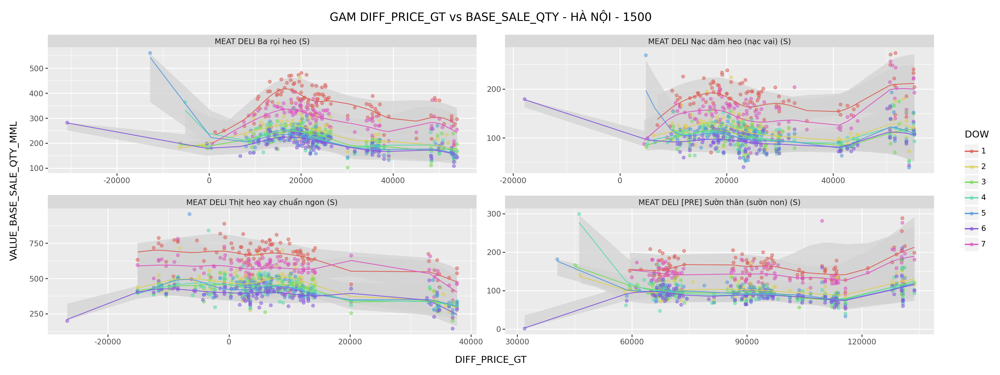

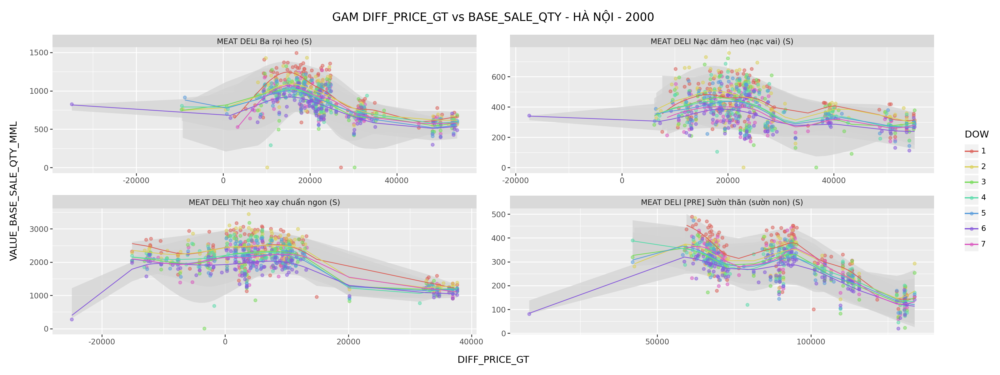

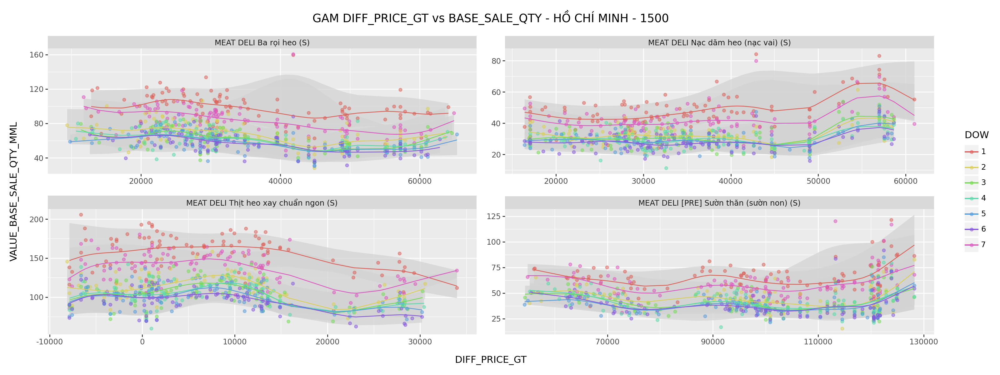

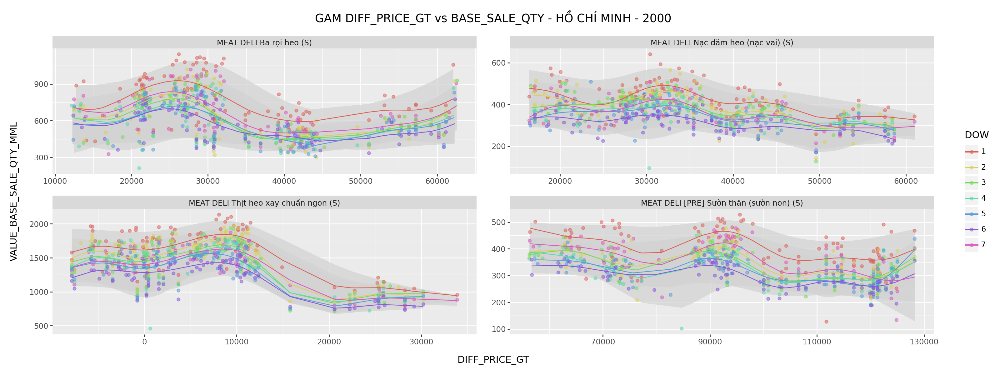

In [710]:
# VISUALIZE
# from plotnine import ggplot, aes, geom_point, geom_ribbon, geom_line, facet_wrap, labs, theme
from plotnine import *

all_gam_results['DOW'] = all_gam_results['DOW'].astype('str')

for city in all_gam_results['CITY'].unique():
    for business_unit in all_gam_results['BUSINESS_UNIT'].unique():
        fig = ggplot(
                data = all_gam_results[
                    (all_gam_results['CITY'] == city)
                    & (all_gam_results['BUSINESS_UNIT'] == business_unit)
                ],
                mapping = aes(x='DIFF_PRICE_GT', y='VALUE_BASE_SALE_QTY_MML', color='DOW', group='DOW')
            ) + geom_ribbon(
                    aes(ymax='pred_BASE_SALE_QTY_MML_0.975', ymin='pred_BASE_SALE_QTY_MML_0.025'), 
                    fill='#d3d3d3', 
                    color='#FF000000', 
                    alpha=0.75, 
                    show_legend = False
            ) + geom_point(
                    alpha=0.5
            ) + geom_line(
                aes(y = 'pred_BASE_SALE_QTY_MML_0.5', color = 'DOW'),
                # color = 'blue'
            ) + facet_wrap(
                'PRODUCT_NAME',
                ncol=2,
                scales='free'
            ) + labs(
                title = f'GAM DIFF_PRICE_GT vs BASE_SALE_QTY - {city} - {business_unit}'
            ) + theme(
                figure_size=(16, 6) # here define the plot size
            )

        fig.show()

In [663]:
# Optimize Price for Predicted Daily Revenue
for col in all_gam_results.columns:
    if col.startswith('pred'):
        all_gam_results['REV_' + col] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results[col] 

all_gam_results['REV_actual'] = (all_gam_results['DIFF_PRICE_GT'] + all_gam_results['RETAIL_PRICE_GT']) * all_gam_results['VALUE_BASE_SALE_QTY_MML'] 

best_50 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'DOW'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.5'] == x['REV_pred_BASE_SALE_QTY_MML_0.5'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_975 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'DOW'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.975'] == x['REV_pred_BASE_SALE_QTY_MML_0.975'].max()
    ].head(1)
).reset_index(level=0, drop=True)

best_025 = all_gam_results.groupby([
    'PRODUCT_NAME', 'CITY', 'BUSINESS_UNIT', 'DOW'
]).apply(
    lambda x: x[
        x['REV_pred_BASE_SALE_QTY_MML_0.025'] == x['REV_pred_BASE_SALE_QTY_MML_0.025'].max()
    ].head(1)
).reset_index(level=0, drop=True)

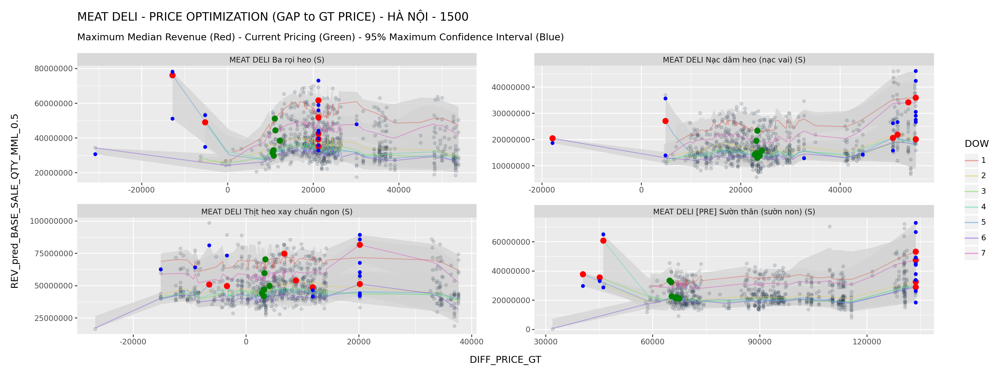

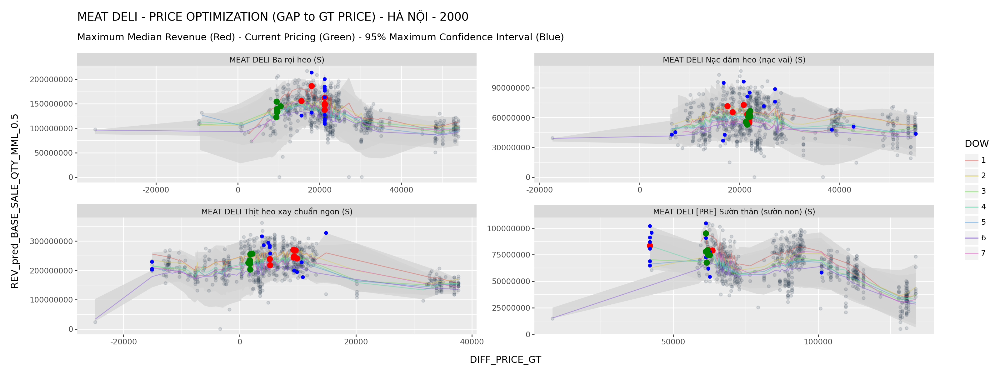

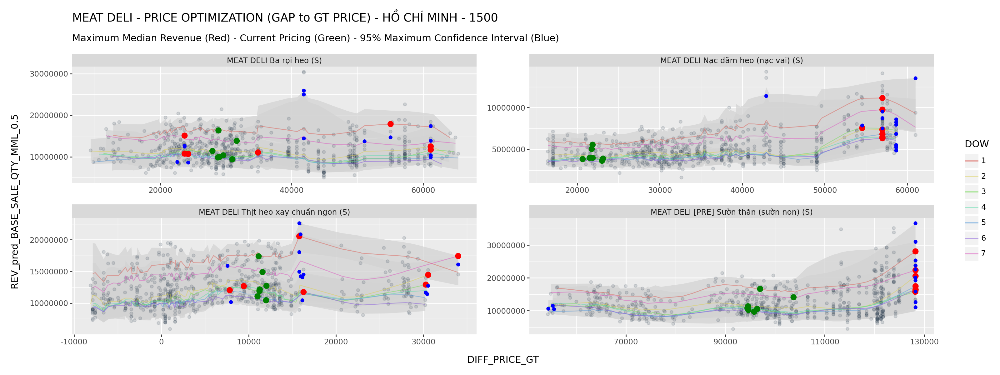

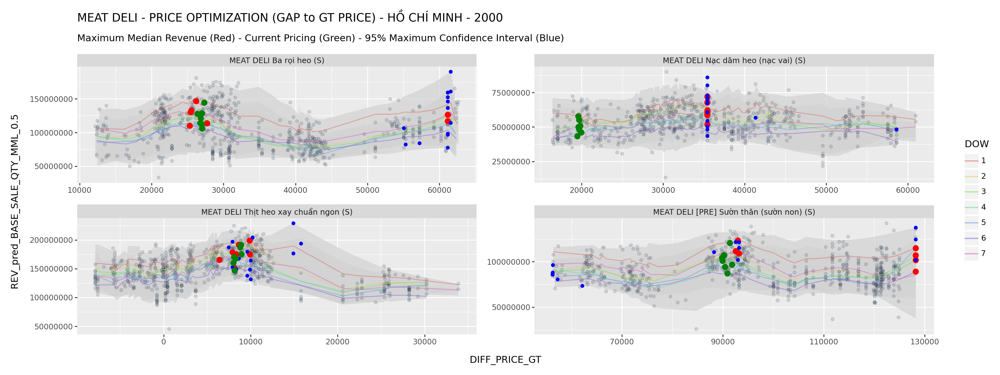

In [668]:
latest_values = all_gam_results.groupby(['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DOW']).agg({'PERIOD_TAG': 'max'})
latest_data = all_gam_results.merge(latest_values, on=['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DOW', 'PERIOD_TAG'], how='inner')

for city in all_gam_results['CITY'].unique():
    for business_unit in all_gam_results['BUSINESS_UNIT'].unique():
        fig = ggplot(
                data = all_gam_results[
                    (all_gam_results['CITY'] == city)
                    & (all_gam_results['BUSINESS_UNIT'] == business_unit)
                    & (all_gam_results['PRODUCT_NAME'].isin(top4_SKU))
                ],
                mapping = aes(x='DIFF_PRICE_GT', y='REV_pred_BASE_SALE_QTY_MML_0.5', color = 'DOW', group = 'DOW')
            ) + geom_ribbon(
                    aes(ymax='REV_pred_BASE_SALE_QTY_MML_0.975', ymin='REV_pred_BASE_SALE_QTY_MML_0.025'), 
                    fill='#d3d3d3', 
                    color='#FF000000', 
                    alpha=0.75, 
                    show_legend = False
            ) + geom_point(
                    aes(y='REV_actual'), alpha=0.15, color = '#2C3E50'
            ) + geom_line(
                    aes(y = 'REV_pred_BASE_SALE_QTY_MML_0.5'),
                    alpha=0.5
            ) + geom_point(
                    data = best_50[
                        (best_50['CITY'] == city)
                        & (best_50['BUSINESS_UNIT'] == business_unit)
                        & (best_50['PRODUCT_NAME'].isin(top4_SKU))
                    ], 
                    color = 'red',
                    size = 3
            ) + geom_point(
                    data = best_975[
                        (best_975['CITY'] == city)
                        & (best_975['BUSINESS_UNIT'] == business_unit)
                        & (best_975['PRODUCT_NAME'].isin(top4_SKU))
                    ], 
                    mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.975'),
                    color = 'blue'
            ) + geom_point(
                    data = best_025[
                        (best_025['CITY'] == city)
                        & (best_025['BUSINESS_UNIT'] == business_unit)
                        & (best_025['PRODUCT_NAME'].isin(top4_SKU))
                    ], 
                    mapping = aes(y= 'REV_pred_BASE_SALE_QTY_MML_0.025'),
                    color = 'blue'
            ) + geom_point(
                    data = latest_data[
                        (latest_data['CITY'] == city)
                        & (latest_data['BUSINESS_UNIT'] == business_unit)
                        & (latest_data['PRODUCT_NAME'].isin(top4_SKU))
                    ], 
                    mapping = aes(x= 'DIFF_PRICE_GT'),
                    color = 'green',
                    size = 3
            ) + facet_wrap(
                'PRODUCT_NAME',
                ncol=2,
                scales='free'
            ) + labs(
                title = f'MEAT DELI - PRICE OPTIMIZATION (GAP to GT PRICE) - {city} - {business_unit}',
                subtitle = 'Maximum Median Revenue (Red) - Current Pricing (Green) - 95% Maximum Confidence Interval (Blue)'
            ) + theme(
                figure_size=(16, 6) # here define the plot size
            )

        fig.show()

In [676]:
df_result = pd.merge(
    best_50[[
        'CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DOW', 'DIFF_PRICE_GT', 'REV_actual', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].reset_index(drop = True).rename(
        columns = {
            'DIFF_PRICE_GT': 'OPTIMAL_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'OPTIMAL_FORECAST_REV',
        }
    ),
    latest_data[[
        'CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DOW', 'DIFF_PRICE_GT', 'pred_BASE_SALE_QTY_MML_0.5', 'REV_pred_BASE_SALE_QTY_MML_0.5'
    ]].rename(
        columns = {
            'DIFF_PRICE_GT': 'CURRENT_DIFF_PRICE_GT',
            'pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_BASE_SALE_QTY',
            'REV_pred_BASE_SALE_QTY_MML_0.5': 'CURRENT_FORECAST_REV',       
        }
    ),
    on = ['CITY', 'PRODUCT_NAME', 'BUSINESS_UNIT', 'DOW']
)

df_result['REV_increase_%'] = ( df_result['OPTIMAL_FORECAST_REV'] - df_result['CURRENT_FORECAST_REV'] ) / df_result['CURRENT_FORECAST_REV']
df_result.to_csv('output/results/PRICE OPTIMIZATION by CITY-PRODUCT-BUSINESS UNIT-DOW.csv', index = False)
df_result_agg =  df_result.groupby(['CITY', 'PRODUCT_NAME'])[['OPTIMAL_FORECAST_REV', 'CURRENT_FORECAST_REV']].sum().reset_index()
df_result_agg['REV_increase_%'] = ( df_result_agg['OPTIMAL_FORECAST_REV'] - df_result_agg['CURRENT_FORECAST_REV'] ) / df_result_agg['CURRENT_FORECAST_REV']
df_result_agg.to_csv('output/results/AGG PRICE OPTIMIZATION by CITY-PRODUCT-BUSINESS UNIT-DOW.csv', index = False)

In [675]:
df_result_agg

,CITY,PRODUCT_NAME,OPTIMAL_FORECAST_REV,CURRENT_FORECAST_REV,REV_increase_%
0,HÀ NỘI,MEAT DELI Ba rọi heo (S),1.442277e+09,1.220568e+09,0.181644
1,HÀ NỘI,MEAT DELI Nạc dăm heo (nạc vai) (S),6.286922e+08,5.376060e+08,0.169429
2,HÀ NỘI,MEAT DELI Thịt heo xay chuẩn ngon (S),2.135957e+09,1.986786e+09,0.075082
3,HÀ NỘI,MEAT DELI [PRE] Sườn thăn (sườn non) (S),8.511987e+08,7.194042e+08,0.183199
4,HỒ CHÍ MINH,MEAT DELI Ba rọi heo (S),9.659600e+08,9.345701e+08,0.033588
5,HỒ CHÍ MINH,MEAT DELI Nạc dăm heo (nạc vai) (S),4.891221e+08,3.811685e+08,0.283218
6,HỒ CHÍ MINH,MEAT DELI Thịt heo xay chuẩn ngon (S),1.336647e+09,1.288693e+09,0.037211
7,HỒ CHÍ MINH,MEAT DELI [PRE] Sườn thăn (sườn non) (S),8.929152e+08,7.937928e+08,0.124872


In [53]:
df_agg_product = df_final_with_gt_price.groupby(['PRODUCT_ID', 'PRODUCT_NAME'])['VALUE_SALE'].sum().reset_index().sort_values(by = ['VALUE_SALE'], ascending = False)
df_agg_product['%_SALE'] = df_agg_product['VALUE_SALE'] / df_agg_product['VALUE_SALE'].sum()
df_agg_product

,PRODUCT_ID,PRODUCT_NAME,VALUE_SALE,%_SALE
15,10617947,MEAT DELI Thịt heo xay chuẩn ngon (S),2.012305e+11,0.291988
21,10617959,MEAT DELI Ba rọi heo (S),1.377428e+11,0.199867
9,10281593,MEAT DELI [PRE] Sườn thăn (sườn non) (S),8.788652e+10,0.127524
19,10617957,MEAT DELI Nạc dăm heo (nạc vai) (S),6.188290e+10,0.089793
17,10617950,MEAT DELI Chân giò heo rút xương (S),4.062403e+10,0.058946
16,10617948,MEAT DELI Sườn vai heo (S),3.416150e+10,0.049569
10,10281594,MEAT DELI [PRE] Bắp giò cuộn (S),2.745413e+10,0.039836
18,10617956,MEAT DELI Thịt vai heo (S),2.629489e+10,0.038154
22,10617961,MEAT DELI Thịt đùi heo (S),2.090158e+10,0.030328
28,10638957,MEAT DELI Cốt lết heo (S),9.647717e+09,0.013999


In [54]:
print('TOP 20 PRODUCT_ID CONTRIBUTE TO:', df_agg_product['%_SALE'][:20].sum(), 'TOTAL SALE')

TOP 20 PRODUCT_ID CONTRIBUTE TO: 0.9934976770289626 TOTAL SALE


In [332]:
df_final2.columns

Index(['CALDAY', 'DOW', 'PRODUCT_ID', 'PRODUCT_NAME', 'CITY', 'REGION_DOMAIN',
       'BUSINESS_UNIT', 'PERIOD_TAG', 'VALUE_MML_TRANSACTIONS_NON_PROMOTION',
       'VALUE_MML_TRANSACTIONS_PROMOTION', 'VALUE_MML_TRANSACTIONS',
       'VALUE_BASE_SALE_QTY_MML_NON_PROMOTION',
       'VALUE_BASE_SALE_QTY_MML_PROMOTION', 'VALUE_BASE_SALE_QTY_MML',
       'VALUE_SALE_MML_NON_PROMOTION', 'VALUE_SALE_MML_PROMOTION',
       'VALUE_SALE_MML', 'VALUE_TRANSACTIONS_TOTAL', 'VALUE_SALE_AMOUNT_TOTAL',
       'VALUE_RETAIL_PRICE_MML', 'VALUE_RETAIL_PRICE_MML_PROMOTION',
       'VALUE_RETAIL_PRICE_MML_NON_PROMOTION', 'RETAIL_PRICE_GT', 'HOLIDAY',
       'OFF_HOLIDAYS', 'PROBA_PURCHASE_MML', 'TRANSACTION_SHARE_VALUE_MML',
       'AVG_BASE_SALE_QTY_PER_TRANSACTION_MML',
       'AVG_BASE_SALE_QTY_PER_STORE_TRANSACTION_MML', 'DIFF_PRICE_GT',
       'PROBA_PURCHASE_MML_PROMOTION', 'TRANSACTION_SHARE_VALUE_MML_PROMOTION',
       'AVG_BASE_SALE_QTY_PER_TRANSACTION_MML_PROMOTION',
       'AVG_BASE_SALE_QTY_PER

In [361]:
import warnings
warnings.filterwarnings("ignore")

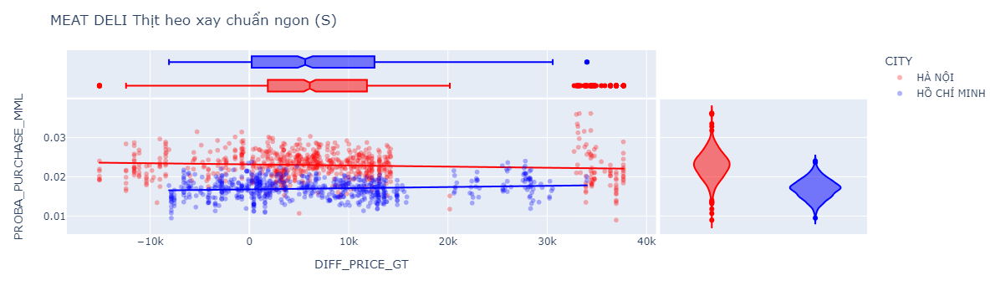

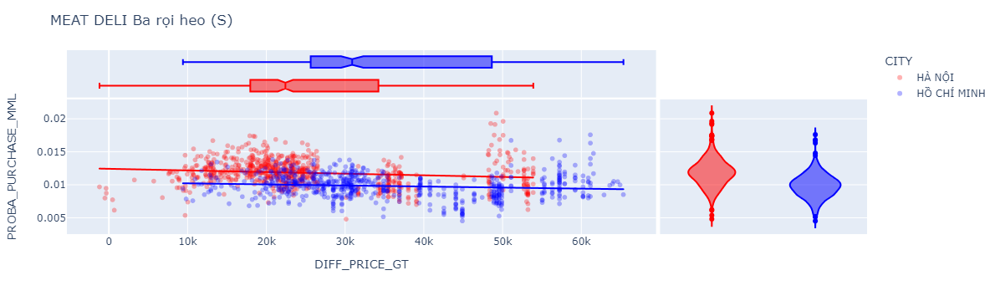

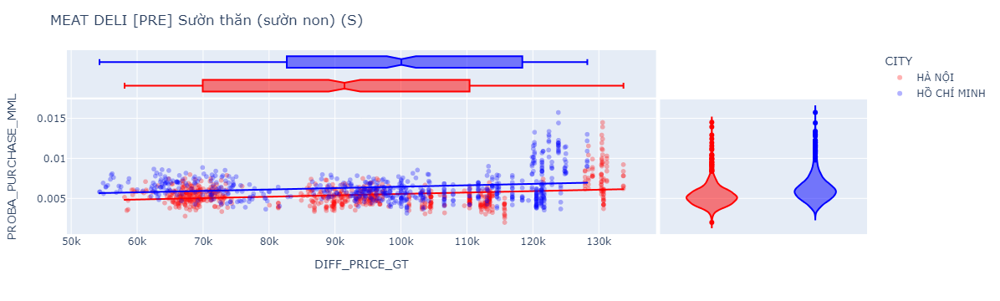

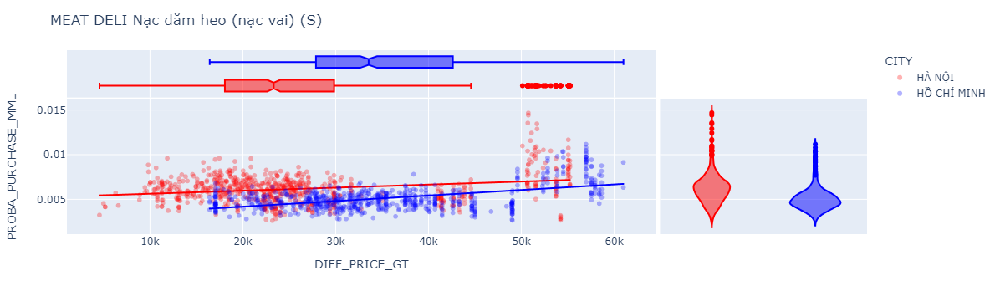

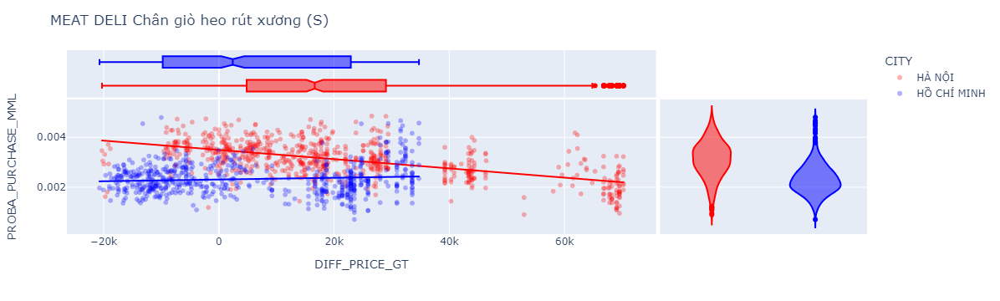

In [362]:
import plotly.express as px

# Define color mapping for specific cities
color_map = {'HÀ NỘI': 'red', 'HỒ CHÍ MINH': 'blue'}

for product in df_agg_product[:5]['PRODUCT_NAME']:

    fig = px.scatter(
        df_final2[
            (df_final2['BUSINESS_UNIT'] == 1500)
            & (df_final2['PRODUCT_NAME'].isin([product]))
            # & (df_final2['CITY'].isin(df_city['CITY'][:2]))
            & (~df_final2['HOLIDAY'].isin(['Tet', 'Pre Tet']))
        ], 
        x="DIFF_PRICE_GT", 
        y="PROBA_PURCHASE_MML", 
        color="CITY", 
        color_discrete_map=color_map,
        opacity = 0.3,
        # size="PROBA_PURCHASE_MML",
        # facet_col="DOW",
        # facet_row="CITY",
        marginal_y="violin",
        marginal_x="box", 
        trendline="ols", 
        # trendline_options=dict(log_x=True),
        template=None
    )

    # Customize the layout
    fig.update_layout(
        title=f"{product}",
        # hovermode="closest",
        width=1200, height=300,
    )

    fig.show()



In [ ]:
data_filtered = df_final_with_gt_price[
    (df_final_with_gt_price['IS_MBS'] == 1)
    & (df_final_with_gt_price['PRODUCT_NAME'].isin(df_agg_product['PRODUCT_NAME'][:6]))
    & (df_final_with_gt_price['AVG_BASE_SALE_QTY_PER_TRANSACTION'] < 2)
    & (df_final_with_gt_price['VALUE_RETAIL_PRICE_NON_PROMOTION'] > 0)
    & (~df_final_with_gt_price['HOLIDAY'].isin(['Tet', 'Pre Tet']))
].rename(
    columns = {
        "VALUE_RETAIL_PRICE_NON_PROMOTION": 'PRICE',
        "PROBA_PURCHASE_MML": 'PROBA'
    }
)[[
    'CALDAY', 'DOW', 'PRODUCT_NAME', 'CITY', 'PRICE', 'RETAIL_PRICE_GT', 'DIFF_PERCENT_RETAIL_PRICE', 'PROBA', 'VALUE_BASE_SALE_QTY', 'AVG_BASE_SALE_QTY_PER_VISIT', 'AVG_BASE_SALE_QTY_PER_TRANSACTION', 'VALUE_TOTAL_TRANSACTIONS_CITY'
]]

data_filtered.head()

# Create an empty dataframe to store the concatenated results
all_gam_results = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        for dow in data_filtered['DOW'].unique():
            product_data = data_filtered[
                (data_filtered['PRODUCT_NAME'] == product)
                & (data_filtered['CITY'] == city)
                & (data_filtered['DOW'] == dow)
            ]
            
            X = product_data['DIFF_PERCENT_RETAIL_PRICE']
            y = product_data['PROBA']
                        
            quantiles = [0.025, 0.5, 0.975]
            gam_results = {}
            
            # Fit the GAM model for the filtered data
            for q in quantiles: 
                try: 
                    gam = ExpectileGAM(s(0), expectile = q)
                    gam.fit(X, y)
                    gam_results[f"pred_PROBA_{q}"] = gam.predict(X)
                except:
                    continue
                
            # Store the results in a dataframe with index that matches the original data
            predictions_gam = pd.DataFrame(gam_results).set_index(X.index)
            
            # Concatenate the results column-wise with the original data
            predictions_gam_df = pd.concat([
                product_data[['CALDAY', 'PRODUCT_NAME', 'CITY', 'DOW',  'RETAIL_PRICE_GT', 'DIFF_PERCENT_RETAIL_PRICE', 'PROBA', 'AVG_BASE_SALE_QTY_PER_TRANSACTION', 'VALUE_TOTAL_TRANSACTIONS_CITY']],
                predictions_gam
            ], 
                axis = 1
            )
            
            # Concatenate results row-wise
            all_gam_results = pd.concat([
                all_gam_results, predictions_gam_df
            ],
                axis = 0
            )
            
all_gam_results


# VISUALIZE
from plotnine import ggplot, aes, geom_point, geom_ribbon, geom_line, facet_wrap, labs, theme

ggplot(
        data = all_gam_results[
            all_gam_results['CITY'].isin(['HỒ CHÍ MINH'])
            # & (all_gam_results['PRODUCT_NAME'] == 'MEAT DELI [PRE] Sườn thăn (sườn non) (S)')
            # & (all_gam_results['DOW'] == '1')
        ],
        mapping = aes(x='DIFF_PERCENT_RETAIL_PRICE', y='PROBA', color='PRODUCT_NAME', group='PRODUCT_NAME')
    ) + geom_ribbon(
            aes(ymax='pred_PROBA_0.975', ymin='pred_PROBA_0.025'), 
            fill='#d3d3d3', 
            color='#FF000000', 
            alpha=0.75, 
            show_legend = False
    ) + geom_point(
            alpha=0.5
    ) + geom_line(
        aes(y = 'pred_PROBA_0.5'),
        color = 'blue'
    ) + facet_wrap(
        'PRODUCT_NAME',
        scales='free'
    ) + labs(
        title = 'GAM Diff Price GT vs Proba of purchase'
    ) + theme(figure_size=(16, 8))  # here you define the plot size


# Optimize Price for Predicted Daily Revenue
for col in all_gam_results.columns:
    if col.startswith('pred'):
        all_gam_results['REV_' + col] = all_gam_results['RETAIL_PRICE_GT'] * (1 + all_gam_results['DIFF_PERCENT_RETAIL_PRICE']) * all_gam_results[col] * all_gam_results['AVG_BASE_SALE_QTY_PER_TRANSACTION'] * all_gam_results['VALUE_TOTAL_TRANSACTIONS_CITY']
        
        

**Linear Regression: Modeling the Effect of DOW on Purchase Probability**



In [73]:
import statsmodels.api as sm
from pygam import GAM, ExpectileGAM, s, l, f
from sklearn.preprocessing import LabelEncoder

In [83]:
df_encoded = df_final_with_gt_price[
    (df_final_with_gt_price['IS_MBS'] == 1)
    # & (df_final_with_gt_price['PRODUCT_NAME'].isin(df_agg_product['PRODUCT_NAME'][:6]))
    & (df_final_with_gt_price['AVG_BASE_SALE_QTY_PER_TRANSACTION'] < 2)
    & (df_final_with_gt_price['VALUE_RETAIL_PRICE_NON_PROMOTION'] > 0)
    # & (df_final_with_gt_price['CITY'].isin(df_city['CITY'][:2]))
    & (~df_final_with_gt_price['HOLIDAY'].isin(['Tet', 'Pre Tet']))
].rename(
    columns = {
        "VALUE_RETAIL_PRICE_NON_PROMOTION": 'PRICE',
        "PROBA_PURCHASE_MML": 'PROBA'
    }
)[[
    'DOW', 'PRODUCT_NAME', 'CITY', 'PRICE', 'PROBA', 'VALUE_BASE_SALE_QTY', 'AVG_BASE_SALE_QTY_PER_VISIT', 'AVG_BASE_SALE_QTY_PER_TRANSACTION', 'DIFF_PERCENT_RETAIL_PRICE'
]]

df_encoded = pd.get_dummies(
    df_encoded,
    columns = ['DOW', 'CITY', 'PRODUCT_NAME'],
    drop_first = False
)

colnames_DOW = df_encoded.columns[df_encoded.columns.str.startswith('DOW')].to_list()
colnames_CITY = df_encoded.columns[df_encoded.columns.str.startswith('CITY')].to_list()
colnames_PRODUCT_NAME = df_encoded.columns[df_encoded.columns.str.startswith('PRODUCT_NAME')].to_list()

df_encoded[colnames_DOW] = df_encoded[colnames_DOW].astype('int')
df_encoded[colnames_CITY] = df_encoded[colnames_CITY].astype('int')
df_encoded[colnames_PRODUCT_NAME] = df_encoded[colnames_PRODUCT_NAME].astype('int')

X = df_encoded[['DIFF_PERCENT_RETAIL_PRICE'] + colnames_DOW + colnames_CITY + colnames_PRODUCT_NAME]
X = sm.add_constant(X)
y = df_encoded['PROBA']

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  PROBA   R-squared:                       0.934
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     8701.
Date:                Mon, 15 Apr 2024   Prob (F-statistic):               0.00
Time:                        18:17:57   Log-Likelihood:                 97881.
No. Observations:               23433   AIC:                        -1.957e+05
Df Residuals:                   23394   BIC:                        -1.954e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                  5.324e+08   1.35e+08      3.945      0.000    2.68e+08    7.97e+08
DIFF_PERCENT_RETAIL_PRICE                                -0.0006      0.000     -4.408      0.000      -0.001      -0.000
DOW_1                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_2                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_3                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_4                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_5                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_6                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
DOW_7                                                  1.041e+08   2.64e+07      3.945      0.000    5.24e+07    1.56e+08
CITY_HÀ NỘI                                           -6.587e+08   1.67e+08     -3.945      0.000   -9.86e+08   -3.31e+08
CITY_HỒ CHÍ MINH                                      -6.587e+08   1.67e+08     -3.945      0.000   -9.86e+08   -3.31e+08
PRODUCT_NAME_MEAT DELI Ba rọi heo (S)                  2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Chân giò heo rút xương (S)     2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Cuống họng heo                  2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Cật heo (S)                     2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Cốt lết heo (S)                 2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Dạ dày heo chuẩn ngon (S)       2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Gan Heo (S)                     2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Giò heo cắt khoanh (S)          2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Lưỡi heo chuẩn ngon (S)         2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Mũi heo chuẩn ngon (S)          2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Nạc thăn heo (S)               2.213e+07   5.61e+06      3.945      0.000    1.11e+07    3.31e+07
PRODUCT_NAME_MEAT DELI Nạc dăm he

**GENERAL PRICE OPTIMIZATION - GAMs**

In [86]:
data_filtered = df_final_with_gt_price[
    (df_final_with_gt_price['IS_MBS'] == 1)
    & (df_final_with_gt_price['PRODUCT_NAME'].isin(df_agg_product['PRODUCT_NAME'][:6]))
    & (df_final_with_gt_price['AVG_BASE_SALE_QTY_PER_TRANSACTION'] < 2)
    & (df_final_with_gt_price['VALUE_RETAIL_PRICE_NON_PROMOTION'] > 0)
    & (~df_final_with_gt_price['HOLIDAY'].isin(['Tet', 'Pre Tet']))
].rename(
    columns = {
        "VALUE_RETAIL_PRICE_NON_PROMOTION": 'PRICE',
        "PROBA_PURCHASE_MML": 'PROBA'
    }
)[[
    'CALDAY', 'DOW', 'PRODUCT_NAME', 'CITY', 'PRICE', 'RETAIL_PRICE_GT', 'DIFF_PERCENT_RETAIL_PRICE', 'PROBA', 'VALUE_BASE_SALE_QTY', 'AVG_BASE_SALE_QTY_PER_VISIT', 'AVG_BASE_SALE_QTY_PER_TRANSACTION', 'VALUE_TOTAL_TRANSACTIONS_CITY'
]]

data_filtered.head()

,CALDAY,DOW,PRODUCT_NAME,CITY,PRICE,RETAIL_PRICE_GT,DIFF_PERCENT_RETAIL_PRICE,PROBA,VALUE_BASE_SALE_QTY,AVG_BASE_SALE_QTY_PER_VISIT,AVG_BASE_SALE_QTY_PER_TRANSACTION,VALUE_TOTAL_TRANSACTIONS_CITY
12,2023-02-16,5,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,87919.901262,93833.333333,-0.063021,0.088973,2006.124,0.037310,0.419340,53769
25,2023-02-16,5,MEAT DELI Ba rọi heo (S),HÀ NỘI,129520.069801,125000.000000,0.036161,0.043854,1015.456,0.018886,0.430643,53769
27,2023-02-16,5,MEAT DELI Sườn vai heo (S),HỒ CHÍ MINH,126320.116567,118666.666667,0.064495,0.014253,147.212,0.005580,0.391521,26381
28,2023-02-16,5,MEAT DELI Sườn vai heo (S),HỒ CHÍ MINH,126320.116567,83333.333333,0.515841,0.014253,147.212,0.005580,0.391521,26381
61,2023-02-16,5,MEAT DELI Nạc dăm heo (nạc vai) (S),HÀ NỘI,129520.104057,120689.655172,0.073167,0.020272,425.536,0.007914,0.390400,53769


In [93]:
# Create an empty dataframe to store the concatenated results
all_gam_results = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        for dow in data_filtered['DOW'].unique():
            product_data = data_filtered[
                (data_filtered['PRODUCT_NAME'] == product)
                & (data_filtered['CITY'] == city)
                & (data_filtered['DOW'] == dow)
            ]
            
            X = product_data['DIFF_PERCENT_RETAIL_PRICE']
            y = product_data['PROBA']
                        
            quantiles = [0.025, 0.5, 0.975]
            gam_results = {}
            
            # Fit the GAM model for the filtered data
            for q in quantiles: 
                try: 
                    gam = ExpectileGAM(s(0), expectile = q)
                    gam.fit(X, y)
                    gam_results[f"pred_PROBA_{q}"] = gam.predict(X)
                except:
                    continue
                
            # Store the results in a dataframe with index that matches the original data
            predictions_gam = pd.DataFrame(gam_results).set_index(X.index)
            
            # Concatenate the results column-wise with the original data
            predictions_gam_df = pd.concat([
                product_data[['CALDAY', 'PRODUCT_NAME', 'CITY', 'DOW',  'RETAIL_PRICE_GT', 'DIFF_PERCENT_RETAIL_PRICE', 'PROBA', 'AVG_BASE_SALE_QTY_PER_TRANSACTION', 'VALUE_TOTAL_TRANSACTIONS_CITY']],
                predictions_gam
            ], 
                axis = 1
            )
            
            # Concatenate results row-wise
            all_gam_results = pd.concat([
                all_gam_results, predictions_gam_df
            ],
                axis = 0
            )
            
all_gam_results

,CALDAY,PRODUCT_NAME,CITY,DOW,RETAIL_PRICE_GT,DIFF_PERCENT_RETAIL_PRICE,PROBA,AVG_BASE_SALE_QTY_PER_TRANSACTION,VALUE_TOTAL_TRANSACTIONS_CITY,pred_PROBA_0.025,pred_PROBA_0.5,pred_PROBA_0.975
12,2023-02-16,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,5,93833.333333,-0.063021,0.088973,0.419340,53769,0.086827,0.090776,0.100679
19406,2023-11-09,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,5,91236.666667,0.133771,0.048362,0.411913,127208,0.048681,0.051510,0.053995
55826,2023-03-23,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,5,89666.666667,0.025127,0.089010,0.419473,63824,0.054952,0.069531,0.088268
78079,2023-12-28,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,5,95410.000000,0.080156,0.050877,0.418870,110580,0.051916,0.059000,0.072979
82722,2023-07-20,MEAT DELI Thịt heo xay chuẩn ngon (S),HÀ NỘI,5,101166.666667,0.027218,0.061996,0.423121,108636,0.055238,0.069699,0.088796
...,...,...,...,...,...,...,...,...,...,...,...,...
971562,2024-02-17,MEAT DELI [PRE] Sườn thăn (sườn non) (S),HỒ CHÍ MINH,7,172205.000000,0.509087,0.017554,0.468594,48079,0.014633,0.017772,0.019997
988834,2024-02-24,MEAT DELI [PRE] Sườn thăn (sườn non) (S),HỒ CHÍ MINH,7,173333.333333,0.485967,0.015580,0.475509,55007,0.015029,0.018397,0.021194
1019070,2024-03-09,MEAT DELI [PRE] Sườn thăn (sườn non) (S),HỒ CHÍ MINH,7,171500.000000,0.504129,0.017419,0.480662,56950,0.014696,0.017786,0.020139
1037325,2024-03-16,MEAT DELI [PRE] Sườn thăn (sườn non) (S),HỒ CHÍ MINH,7,174072.500000,0.481481,0.018443,0.478902,56933,0.015137,0.018668,0.021577


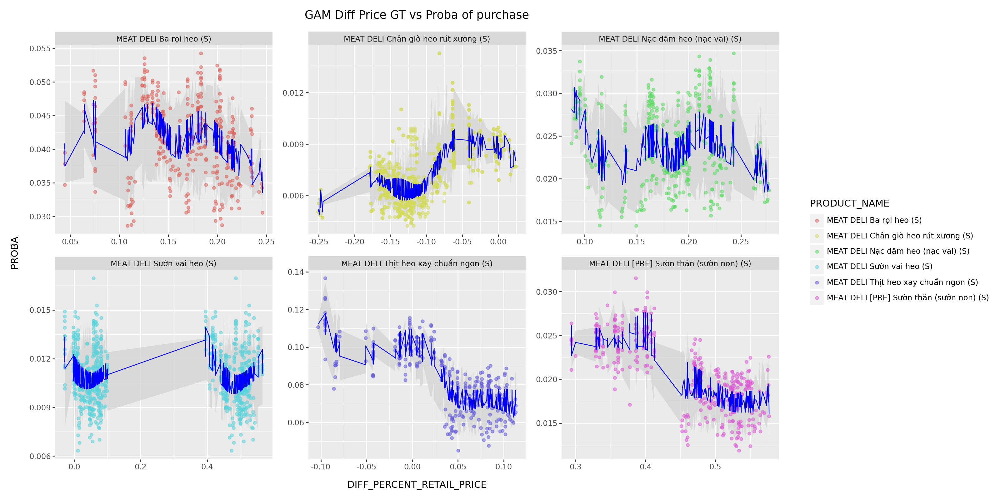

In [140]:
from plotnine import ggplot, aes, geom_point, geom_ribbon, geom_line, facet_wrap, labs, theme

ggplot(
        data = all_gam_results[
            all_gam_results['CITY'].isin(['HỒ CHÍ MINH'])
            # & (all_gam_results['PRODUCT_NAME'] == 'MEAT DELI [PRE] Sườn thăn (sườn non) (S)')
            # & (all_gam_results['DOW'] == '1')
        ],
        mapping = aes(x='DIFF_PERCENT_RETAIL_PRICE', y='PROBA', color='PRODUCT_NAME', group='PRODUCT_NAME')
    ) + geom_ribbon(
            aes(ymax='pred_PROBA_0.975', ymin='pred_PROBA_0.025'), 
            fill='#d3d3d3', 
            color='#FF000000', 
            alpha=0.75, 
            show_legend = False
    ) + geom_point(
            alpha=0.5
    ) + geom_line(
        aes(y = 'pred_PROBA_0.5'),
        color = 'blue'
    ) + facet_wrap(
        'PRODUCT_NAME',
        scales='free'
    ) + labs(
        title = 'GAM Diff Price GT vs Proba of purchase'
    ) + theme(figure_size=(16, 8))  # here you define the plot size

In [ ]:
# Optimize Price for Predicted Daily Revenue
for col in all_gam_results.columns:
    if col.startswith('pred'):
        all_gam_results['REV_' + col] = all_gam_results['RETAIL_PRICE_GT'] * (1 + all_gam_results['DIFF_PERCENT_RETAIL_PRICE']) * all_gam_results[col] * all_gam_results['AVG_BASE_SALE_QTY_PER_TRANSACTION'] * all_gam_results['VALUE_TOTAL_TRANSACTIONS_CITY']
        
        
        
        

In [519]:
df_model = pd.DataFrame()

for product in data_filtered['PRODUCT_NAME'].unique():
    for city in data_filtered['CITY'].unique():
        for dow in data_filtered['DOW'].unique():

            df_encoded = df_final[
                (df_final['IS_MBS'] == 1)
                & (df_final['PRODUCT_NAME'].isin([product]))
                # & (df_final['DOW'].isin([dow]))
                & (df_final['AVG_BASE_SALE_QTY_PER_TRANSACTION'] < 2)
                & (df_final['VALUE_RETAIL_PRICE_NON_PROMOTION'] > 0)
                & (df_final['CITY'].isin([city]))
                & (~df_final['HOLIDAY'].isin(['Tet', 'Pre Tet']))
            ].rename(
                columns = {
                    "VALUE_RETAIL_PRICE_NON_PROMOTION": 'PRICE',
                    "PROBA_PURCHASE_MML": 'PROBA'
                }
            )[[
                'DOW', 'PRODUCT_NAME', 'CITY', 'PRICE', 'PROBA', 'VALUE_BASE_SALE_QTY', 'AVG_BASE_SALE_QTY_PER_VISIT', 'AVG_BASE_SALE_QTY_PER_TRANSACTION'
            ]]

            df_encoded = pd.get_dummies(
                df_encoded,
                columns = ['DOW', 'CITY', 'PRODUCT_NAME'],
                drop_first = False
            )

            colnames_DOW = df_encoded.columns[df_encoded.columns.str.startswith('DOW')].to_list()
            # colnames_CITY = df_encoded.columns[df_encoded.columns.str.startswith('CITY')].to_list()
            # colnames_PRODUCT_NAME = df_encoded.columns[df_encoded.columns.str.startswith('PRODUCT_NAME')].to_list()

            df_encoded[colnames_DOW] = df_encoded[colnames_DOW].astype('int')
            # df_encoded[colnames_CITY] = df_encoded[colnames_CITY].astype('int')
            # df_encoded[colnames_PRODUCT_NAME] = df_encoded[colnames_PRODUCT_NAME].astype('int')

            # X = df_encoded[['PRICE'] + colnames_DOW + colnames_CITY + colnames_PRODUCT_NAME]
            # X = df_encoded[['PRICE'] + colnames_DOW ]
            X = df_encoded['PRICE']
            X = sm.add_constant(X)
            y = df_encoded['PROBA']

            model = sm.OLS(y, X).fit()
            
            # Create a new DataFrame for each iteration
            df_model_new = pd.DataFrame({
                'PRODUCT_NAME': [product],
                'CITY': [city],
                'DOW': [dow],
                'PRICE_ELASTICITY': [model.params['PRICE']],
                'R2': [model.rsquared]
            })
            
            df_model = pd.concat([
                df_model,
                df_model_new
            ], 
                ignore_index = True
            )
                        
            # print(product, '-', city, '-', {dow}, '- R2:', model.rsquared)
            # print(model.params)


In [528]:
df_simulation = pd.merge(
    data_filtered,
    df_model,
    how = 'left', 
    on = ['PRODUCT_NAME', 'DOW', 'CITY']
)

df_simulation['OPTIMAL_ADJUST_PRICE_RATE'] = ( - df_simulation['PRICE_ELASTICITY'] * df_simulation['PRICE'] - df_simulation['PROBA'] ) / (2 * df_simulation['PRICE'])
df_simulation['OPTIMAL_PRICE'] = (1 + df_simulation['OPTIMAL_ADJUST_PRICE_RATE']) * df_simulation['PRICE']
df_simulation['OPTIMAL_PROBA'] = df_simulation['PROBA'] + df_simulation['PRICE_ELASTICITY'] * df_simulation['PRICE'] * df_simulation['OPTIMAL_ADJUST_PRICE_RATE']
df_simulation['REVENUE'] = df_simulation['PRICE'] * df_simulation['PROBA'] * df_simulation['AVG_BASE_SALE_QTY_PER_TRANSACTION']
df_simulation['OPTIMAL_REVENUE'] = df_simulation['OPTIMAL_PRICE'] * df_simulation['OPTIMAL_PROBA'] * df_simulation['AVG_BASE_SALE_QTY_PER_TRANSACTION']

df_simulation['OPTIMAL_REVENUE'].sum() - df_simulation['REVENUE'].sum() 

-5.324128953740001

In [483]:
from ggplot import *